# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('../input/cs231n-gan/gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

11493376/11490434 [==============================] - 0s 0us/step


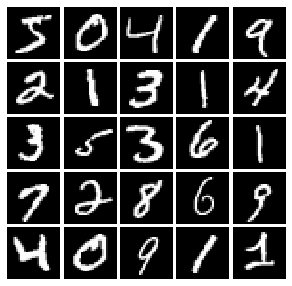

In [3]:
# show a batch
mnist = MNIST(batch_size=25) 
show_images(mnist.X[:25])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    x = tf.nn.leaky_relu(x,alpha)
    return x
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 1.11759e-08


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    noise = tf.random.uniform([batch_size,dim],minval = -1,maxval = 1)
    return noise
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [8]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [9]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [10]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(noise_dim),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(784,activation = tf.nn.tanh)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [11]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [12]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    real_loss = cross_entropy(tf.ones_like(logits_real), logits_real)
    fake_loss = cross_entropy(tf.zeros_like(logits_fake), logits_fake)
    loss = real_loss + fake_loss
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = cross_entropy(tf.ones_like(logits_fake), logits_fake)
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [13]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [14]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [15]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    D_solver = tf.optimizers.Adam(learning_rate,beta1)
    G_solver = tf.optimizers.Adam(learning_rate,beta1)
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [16]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.097, G:0.7119


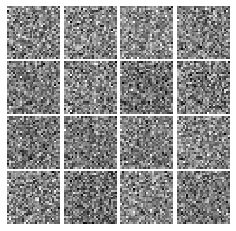

Epoch: 0, Iter: 20, D: 0.5815, G:0.9338


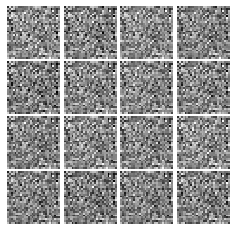

Epoch: 0, Iter: 40, D: 0.4509, G:1.186


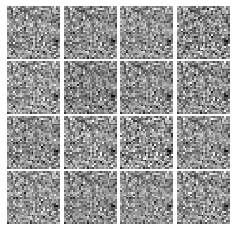

Epoch: 0, Iter: 60, D: 1.965, G:1.664


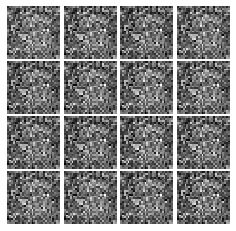

Epoch: 0, Iter: 80, D: 1.318, G:0.9821


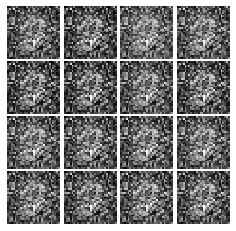

Epoch: 0, Iter: 100, D: 2.423, G:0.4944


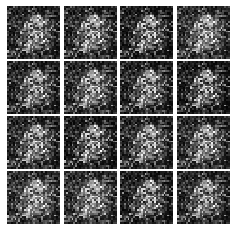

Epoch: 0, Iter: 120, D: 1.777, G:1.47


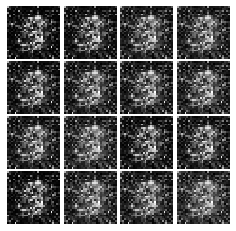

Epoch: 0, Iter: 140, D: 0.9253, G:1.315


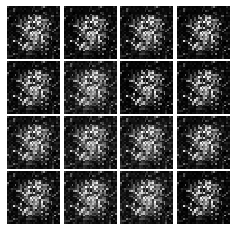

Epoch: 0, Iter: 160, D: 2.23, G:1.258


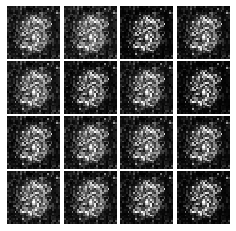

Epoch: 0, Iter: 180, D: 0.9404, G:1.604


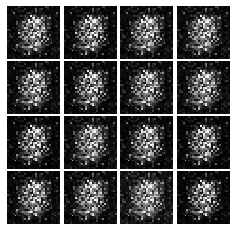

Epoch: 0, Iter: 200, D: 1.137, G:1.275


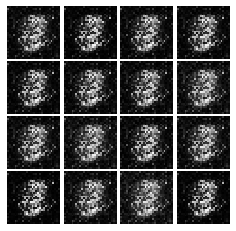

Epoch: 0, Iter: 220, D: 1.415, G:0.7685


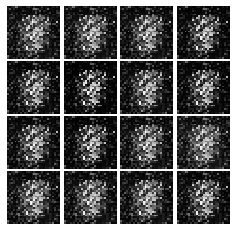

Epoch: 0, Iter: 240, D: 0.8669, G:1.801


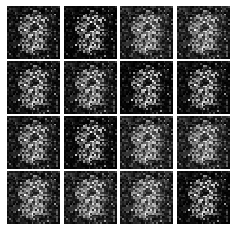

Epoch: 0, Iter: 260, D: 1.432, G:1.66


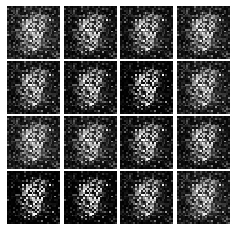

Epoch: 0, Iter: 280, D: 1.152, G:1.437


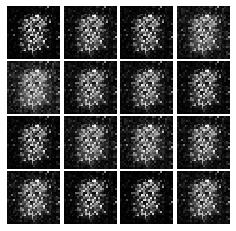

Epoch: 0, Iter: 300, D: 0.6559, G:2.071


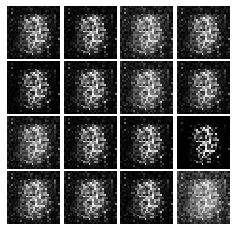

Epoch: 0, Iter: 320, D: 1.71, G:1.004


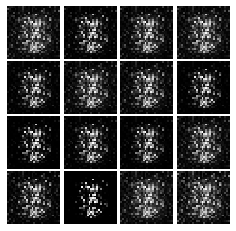

Epoch: 0, Iter: 340, D: 1.224, G:1.383


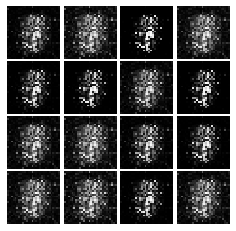

Epoch: 0, Iter: 360, D: 1.181, G:1.039


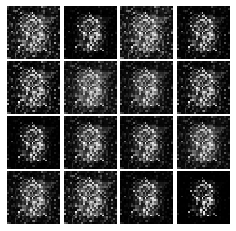

Epoch: 0, Iter: 380, D: 1.211, G:1.708


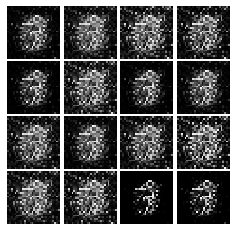

Epoch: 0, Iter: 400, D: 1.121, G:0.9618


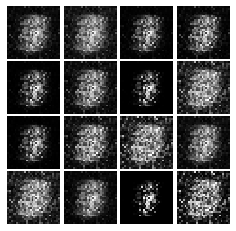

Epoch: 0, Iter: 420, D: 0.942, G:1.82


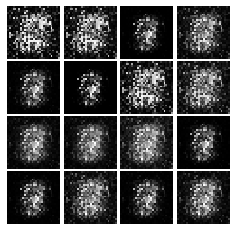

Epoch: 0, Iter: 440, D: 1.356, G:0.7784


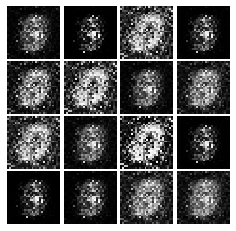

Epoch: 0, Iter: 460, D: 0.7948, G:2.336


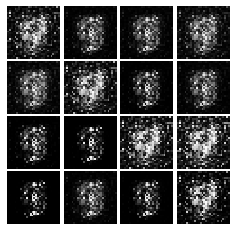

Epoch: 1, Iter: 480, D: 1.032, G:2.487


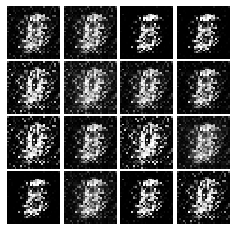

Epoch: 1, Iter: 500, D: 1.201, G:1.329


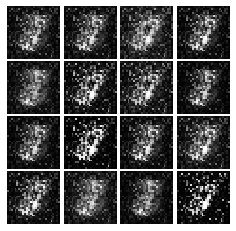

Epoch: 1, Iter: 520, D: 1.157, G:1.227


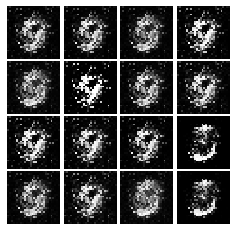

Epoch: 1, Iter: 540, D: 0.7769, G:1.434


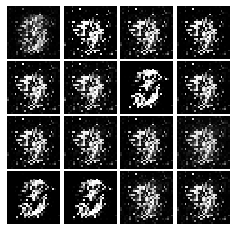

Epoch: 1, Iter: 560, D: 0.9856, G:1.637


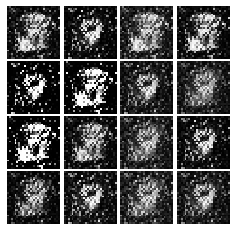

Epoch: 1, Iter: 580, D: 0.8842, G:2.316


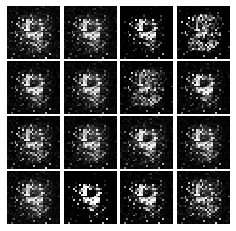

Epoch: 1, Iter: 600, D: 1.184, G:1.23


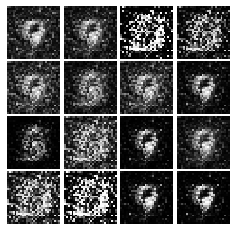

Epoch: 1, Iter: 620, D: 1.837, G:0.6157


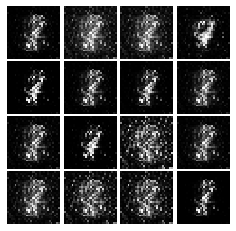

Epoch: 1, Iter: 640, D: 0.9183, G:1.486


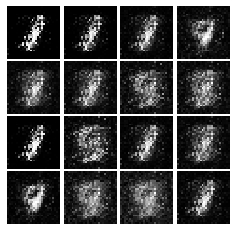

Epoch: 1, Iter: 660, D: 1.018, G:1.438


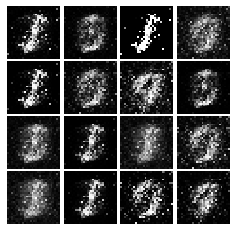

Epoch: 1, Iter: 680, D: 0.8709, G:1.714


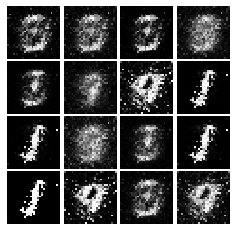

Epoch: 1, Iter: 700, D: 1.453, G:0.7246


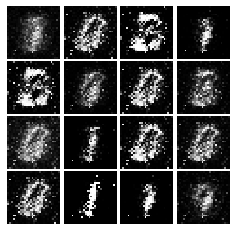

Epoch: 1, Iter: 720, D: 1.179, G:1.373


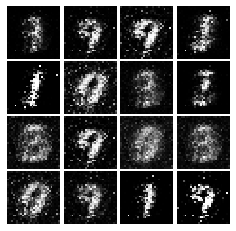

Epoch: 1, Iter: 740, D: 1.474, G:0.857


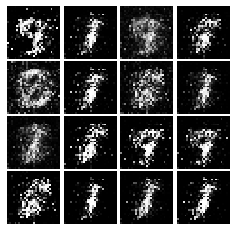

Epoch: 1, Iter: 760, D: 1.157, G:1.521


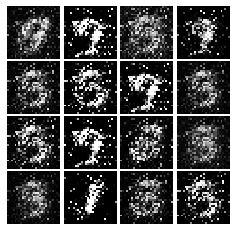

Epoch: 1, Iter: 780, D: 1.4, G:0.8758


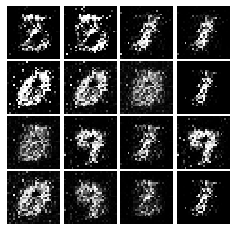

Epoch: 1, Iter: 800, D: 1.121, G:1.485


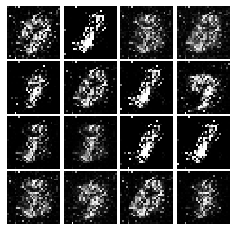

Epoch: 1, Iter: 820, D: 1.24, G:1.557


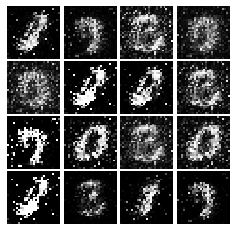

Epoch: 1, Iter: 840, D: 1.049, G:1.424


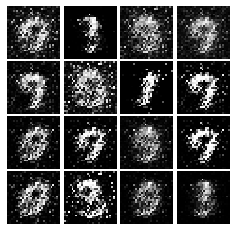

Epoch: 1, Iter: 860, D: 1.25, G:0.9447


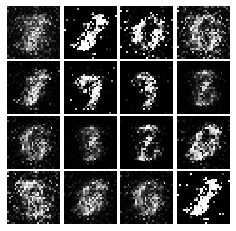

Epoch: 1, Iter: 880, D: 1.24, G:0.8393


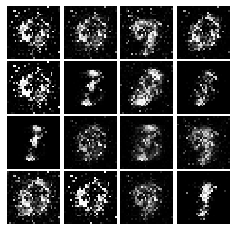

Epoch: 1, Iter: 900, D: 1.329, G:0.5283


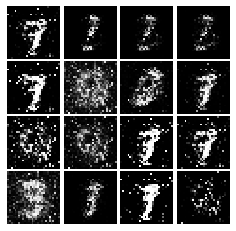

Epoch: 1, Iter: 920, D: 1.974, G:0.6844


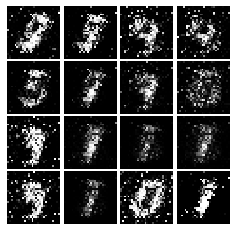

Epoch: 2, Iter: 940, D: 1.053, G:1.431


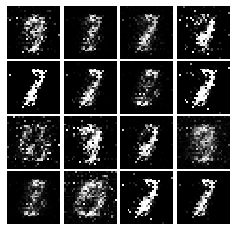

Epoch: 2, Iter: 960, D: 0.9197, G:1.441


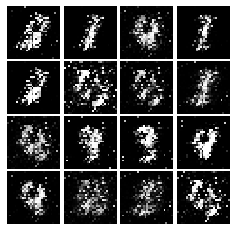

Epoch: 2, Iter: 980, D: 1.24, G:1.287


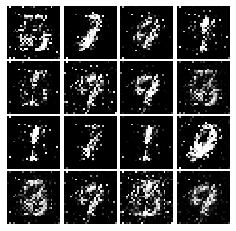

Epoch: 2, Iter: 1000, D: 1.129, G:1.054


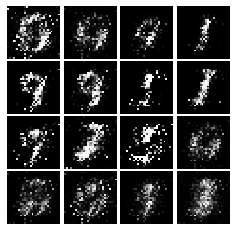

Epoch: 2, Iter: 1020, D: 1.162, G:1.326


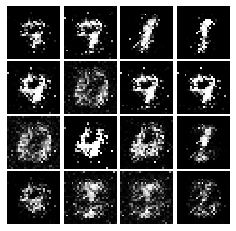

Epoch: 2, Iter: 1040, D: 1.067, G:1.079


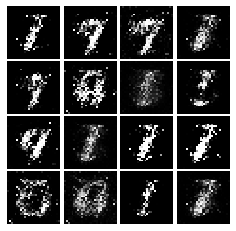

Epoch: 2, Iter: 1060, D: 1.372, G:0.9905


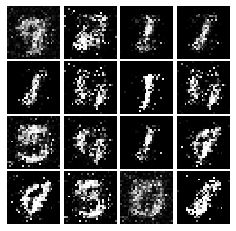

Epoch: 2, Iter: 1080, D: 1.163, G:1.123


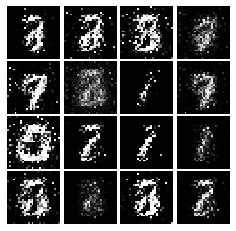

Epoch: 2, Iter: 1100, D: 1.299, G:2.052


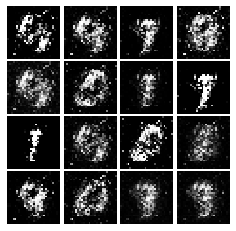

Epoch: 2, Iter: 1120, D: 1.1, G:1.502


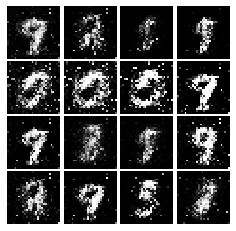

Epoch: 2, Iter: 1140, D: 1.179, G:1.032


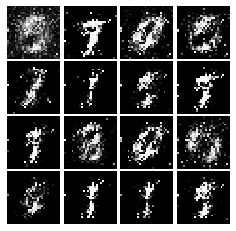

Epoch: 2, Iter: 1160, D: 0.9895, G:1.035


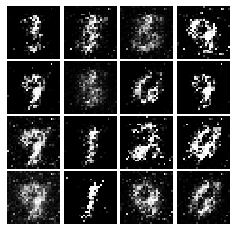

Epoch: 2, Iter: 1180, D: 1.392, G:1.514


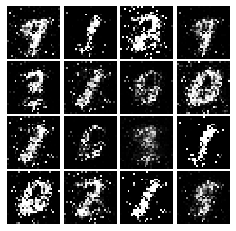

Epoch: 2, Iter: 1200, D: 1.077, G:1.547


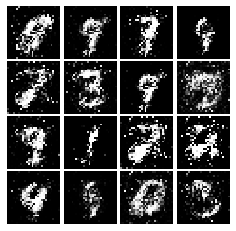

Epoch: 2, Iter: 1220, D: 1.164, G:1.091


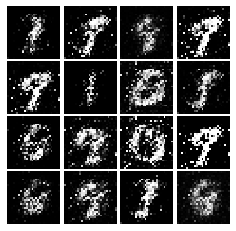

Epoch: 2, Iter: 1240, D: 1.01, G:1.207


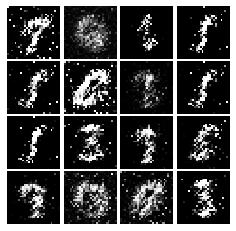

Epoch: 2, Iter: 1260, D: 1.056, G:1.553


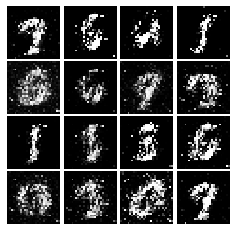

Epoch: 2, Iter: 1280, D: 1.255, G:1.174


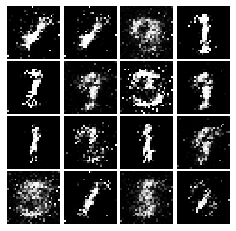

Epoch: 2, Iter: 1300, D: 1.028, G:1.127


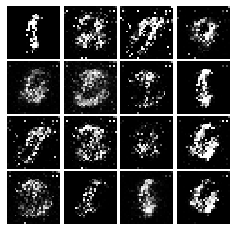

Epoch: 2, Iter: 1320, D: 1.146, G:1.015


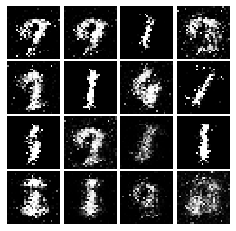

Epoch: 2, Iter: 1340, D: 1.21, G:1.375


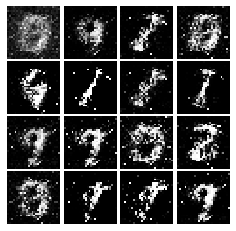

Epoch: 2, Iter: 1360, D: 1.369, G:0.5676


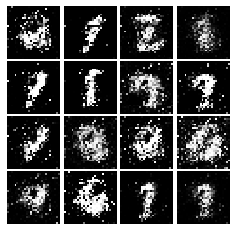

Epoch: 2, Iter: 1380, D: 1.15, G:1.201


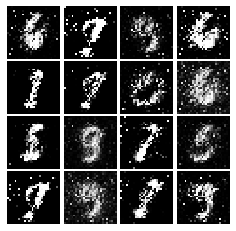

Epoch: 2, Iter: 1400, D: 1.071, G:1.138


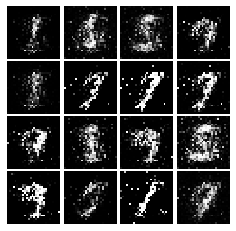

Epoch: 3, Iter: 1420, D: 1.09, G:1.116


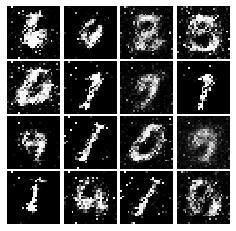

Epoch: 3, Iter: 1440, D: 1.138, G:1.047


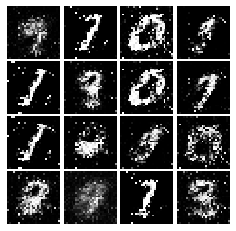

Epoch: 3, Iter: 1460, D: 1.207, G:1.26


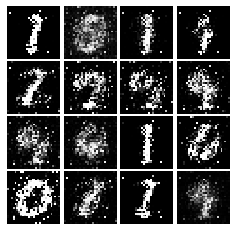

Epoch: 3, Iter: 1480, D: 1.359, G:0.7921


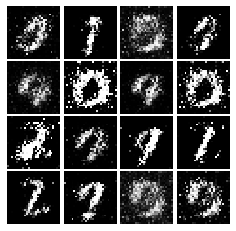

Epoch: 3, Iter: 1500, D: 1.237, G:0.9378


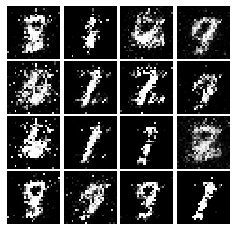

Epoch: 3, Iter: 1520, D: 1.323, G:1.19


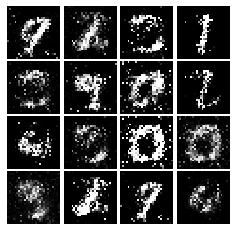

Epoch: 3, Iter: 1540, D: 1.33, G:0.9398


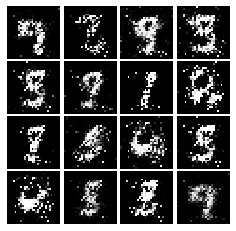

Epoch: 3, Iter: 1560, D: 1.064, G:0.9868


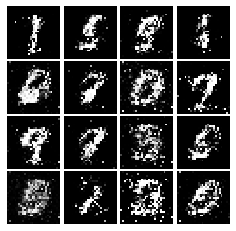

Epoch: 3, Iter: 1580, D: 1.062, G:1.396


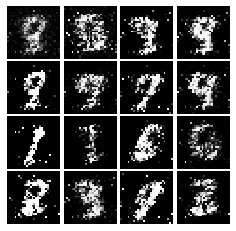

Epoch: 3, Iter: 1600, D: 1.321, G:1.118


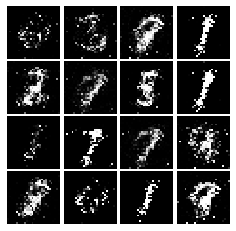

Epoch: 3, Iter: 1620, D: 1.219, G:1.042


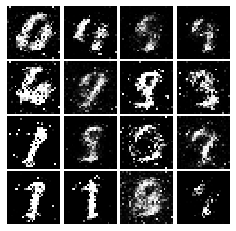

Epoch: 3, Iter: 1640, D: 1.254, G:0.9956


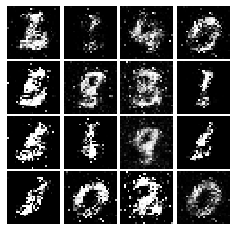

Epoch: 3, Iter: 1660, D: 1.116, G:1.214


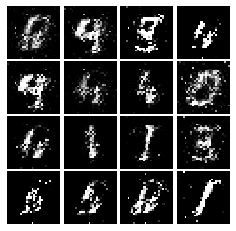

Epoch: 3, Iter: 1680, D: 1.281, G:0.9713


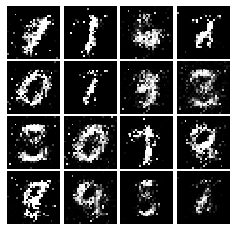

Epoch: 3, Iter: 1700, D: 1.286, G:1.128


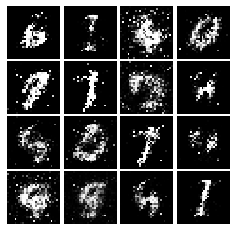

Epoch: 3, Iter: 1720, D: 1.023, G:1.134


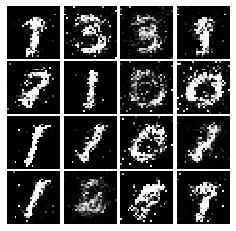

Epoch: 3, Iter: 1740, D: 1.188, G:1.037


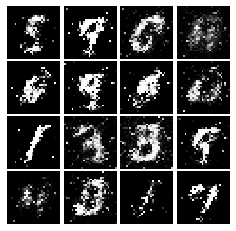

Epoch: 3, Iter: 1760, D: 1.273, G:0.8901


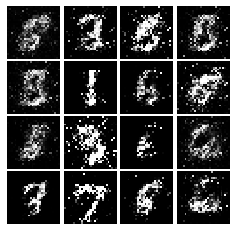

Epoch: 3, Iter: 1780, D: 1.31, G:0.8952


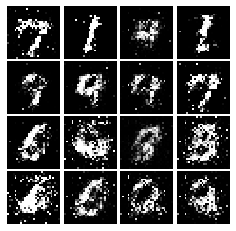

Epoch: 3, Iter: 1800, D: 1.292, G:0.7991


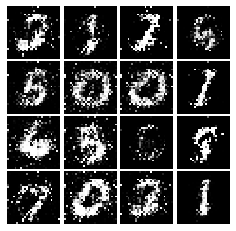

Epoch: 3, Iter: 1820, D: 1.341, G:0.828


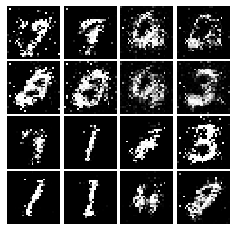

Epoch: 3, Iter: 1840, D: 1.313, G:0.8292


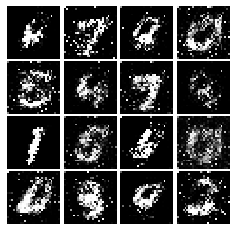

Epoch: 3, Iter: 1860, D: 1.162, G:1.611


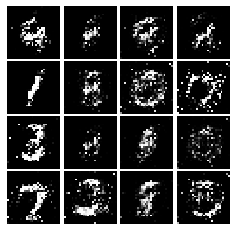

Epoch: 4, Iter: 1880, D: 1.214, G:0.9851


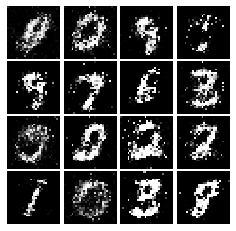

Epoch: 4, Iter: 1900, D: 1.191, G:1.056


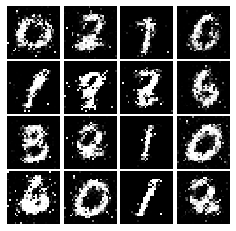

Epoch: 4, Iter: 1920, D: 1.22, G:0.9389


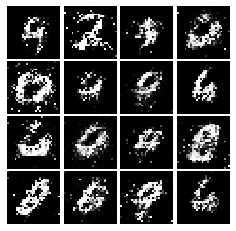

Epoch: 4, Iter: 1940, D: 1.226, G:0.8523


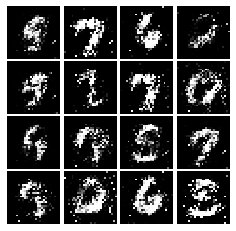

Epoch: 4, Iter: 1960, D: 1.223, G:0.9325


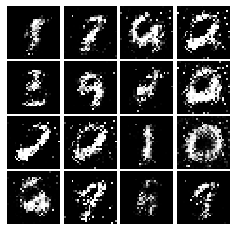

Epoch: 4, Iter: 1980, D: 1.296, G:0.8933


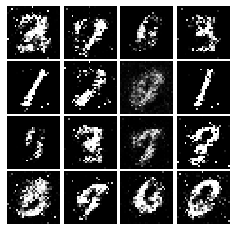

Epoch: 4, Iter: 2000, D: 1.28, G:0.8991


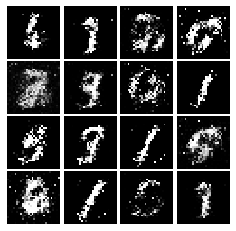

Epoch: 4, Iter: 2020, D: 1.319, G:0.8858


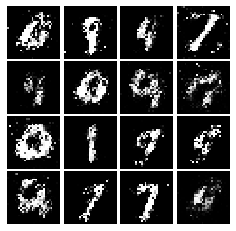

Epoch: 4, Iter: 2040, D: 1.236, G:0.8901


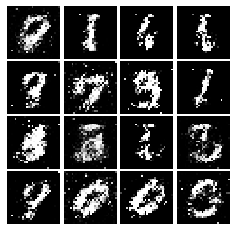

Epoch: 4, Iter: 2060, D: 1.396, G:0.9965


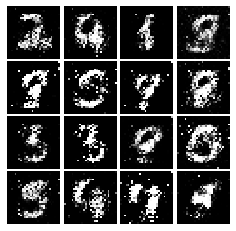

Epoch: 4, Iter: 2080, D: 1.329, G:0.9504


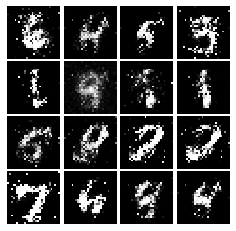

Epoch: 4, Iter: 2100, D: 1.225, G:1.083


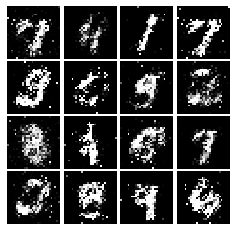

Epoch: 4, Iter: 2120, D: 1.492, G:1.185


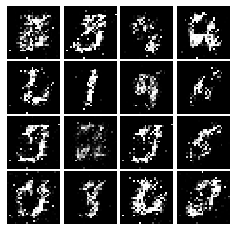

Epoch: 4, Iter: 2140, D: 1.282, G:1.046


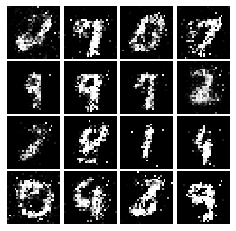

Epoch: 4, Iter: 2160, D: 1.474, G:0.843


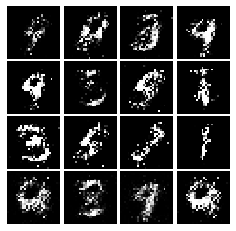

Epoch: 4, Iter: 2180, D: 1.266, G:0.8066


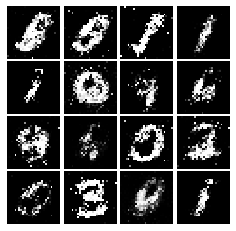

Epoch: 4, Iter: 2200, D: 1.31, G:0.8906


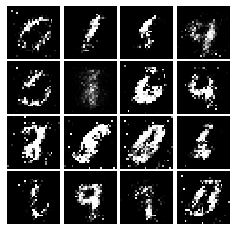

Epoch: 4, Iter: 2220, D: 1.24, G:0.88


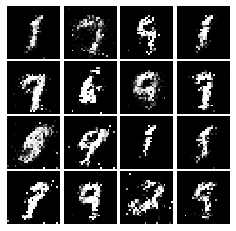

Epoch: 4, Iter: 2240, D: 1.311, G:0.7951


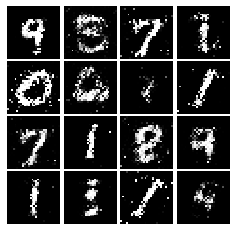

Epoch: 4, Iter: 2260, D: 1.356, G:0.8506


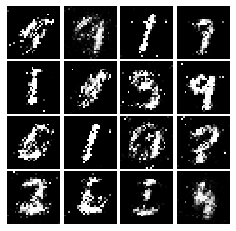

Epoch: 4, Iter: 2280, D: 1.281, G:1.047


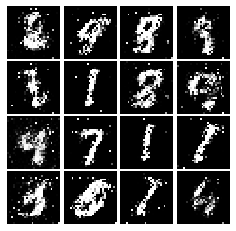

Epoch: 4, Iter: 2300, D: 1.237, G:0.8607


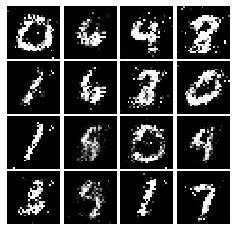

Epoch: 4, Iter: 2320, D: 1.216, G:1.055


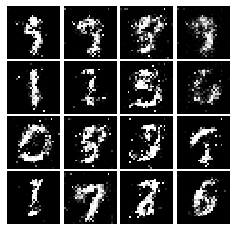

Epoch: 4, Iter: 2340, D: 1.179, G:0.8708


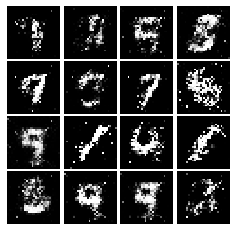

Epoch: 5, Iter: 2360, D: 1.322, G:0.8814


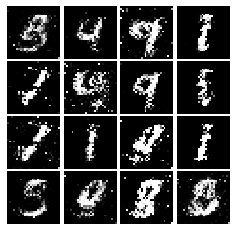

Epoch: 5, Iter: 2380, D: 1.289, G:0.7261


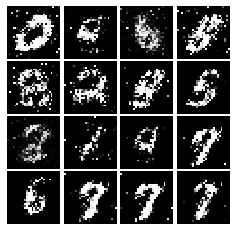

Epoch: 5, Iter: 2400, D: 1.239, G:0.9168


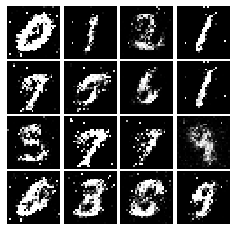

Epoch: 5, Iter: 2420, D: 1.211, G:0.8475


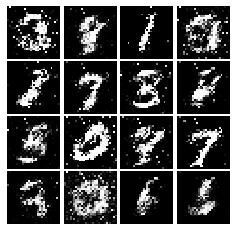

Epoch: 5, Iter: 2440, D: 1.198, G:0.8528


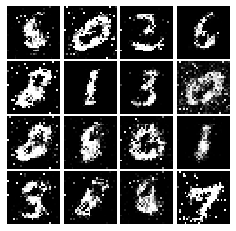

Epoch: 5, Iter: 2460, D: 1.079, G:1.006


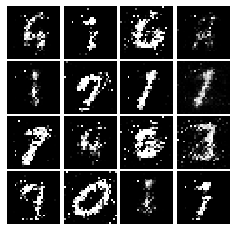

Epoch: 5, Iter: 2480, D: 1.382, G:0.8963


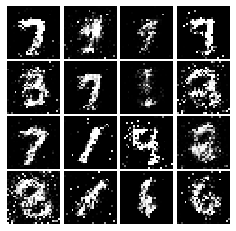

Epoch: 5, Iter: 2500, D: 1.21, G:0.8542


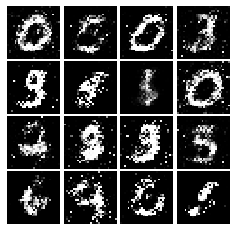

Epoch: 5, Iter: 2520, D: 1.454, G:0.9197


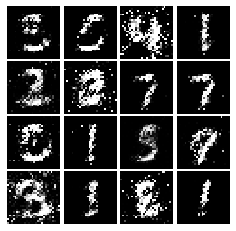

Epoch: 5, Iter: 2540, D: 1.279, G:0.9261


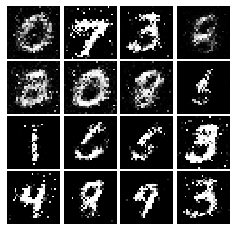

Epoch: 5, Iter: 2560, D: 1.26, G:0.8181


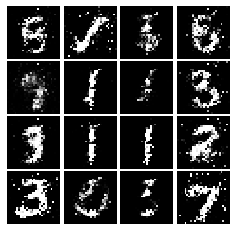

Epoch: 5, Iter: 2580, D: 1.192, G:0.902


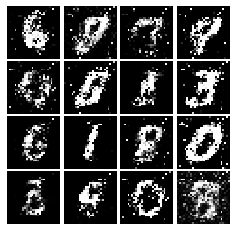

Epoch: 5, Iter: 2600, D: 1.374, G:0.9359


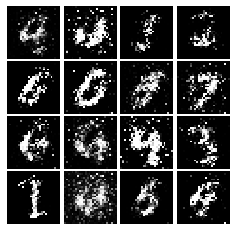

Epoch: 5, Iter: 2620, D: 1.309, G:0.8596


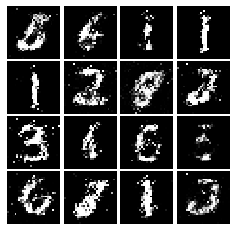

Epoch: 5, Iter: 2640, D: 1.266, G:0.9752


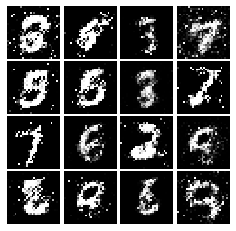

Epoch: 5, Iter: 2660, D: 1.291, G:0.9216


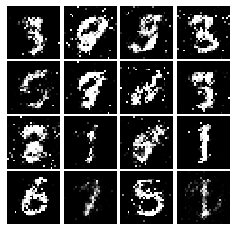

Epoch: 5, Iter: 2680, D: 1.317, G:0.8766


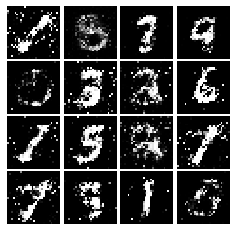

Epoch: 5, Iter: 2700, D: 1.294, G:0.9115


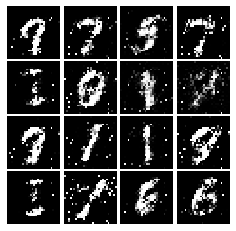

Epoch: 5, Iter: 2720, D: 1.259, G:0.8328


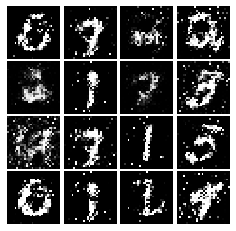

Epoch: 5, Iter: 2740, D: 1.158, G:0.8783


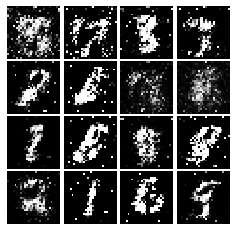

Epoch: 5, Iter: 2760, D: 1.386, G:0.8849


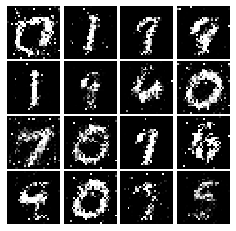

Epoch: 5, Iter: 2780, D: 1.28, G:0.8477


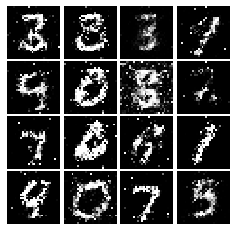

Epoch: 5, Iter: 2800, D: 1.306, G:0.8307


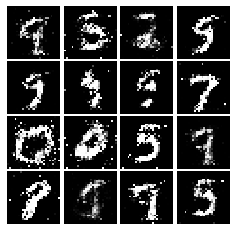

Epoch: 6, Iter: 2820, D: 1.275, G:0.8985


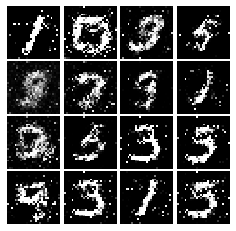

Epoch: 6, Iter: 2840, D: 1.283, G:0.8197


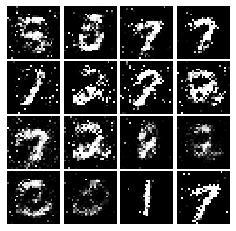

Epoch: 6, Iter: 2860, D: 1.147, G:1.007


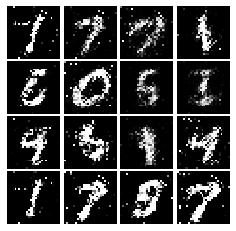

Epoch: 6, Iter: 2880, D: 1.179, G:1.22


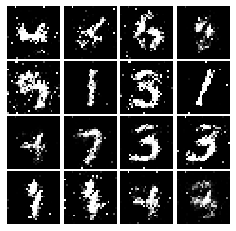

Epoch: 6, Iter: 2900, D: 1.263, G:0.8293


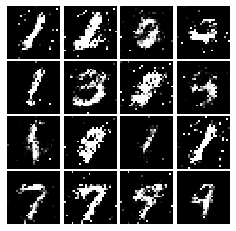

Epoch: 6, Iter: 2920, D: 1.341, G:0.7875


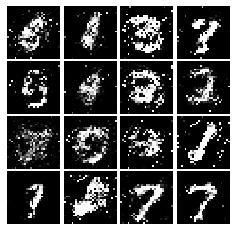

Epoch: 6, Iter: 2940, D: 1.288, G:0.9125


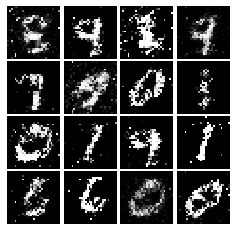

Epoch: 6, Iter: 2960, D: 1.262, G:0.8011


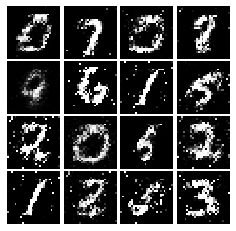

Epoch: 6, Iter: 2980, D: 1.462, G:0.7409


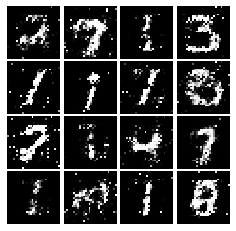

Epoch: 6, Iter: 3000, D: 1.438, G:0.802


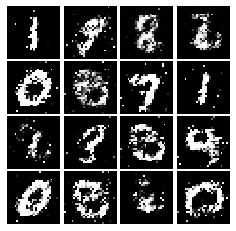

Epoch: 6, Iter: 3020, D: 1.47, G:0.8933


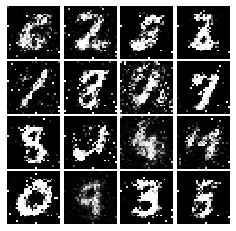

Epoch: 6, Iter: 3040, D: 1.308, G:0.8312


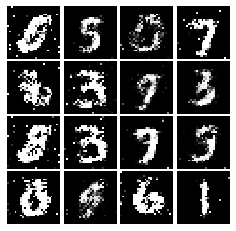

Epoch: 6, Iter: 3060, D: 1.316, G:0.8988


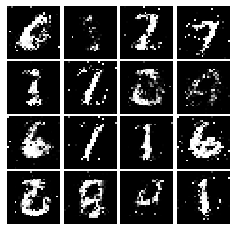

Epoch: 6, Iter: 3080, D: 1.256, G:0.9909


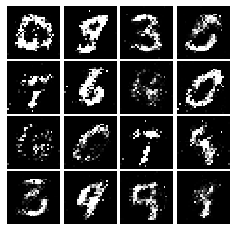

Epoch: 6, Iter: 3100, D: 1.21, G:0.8358


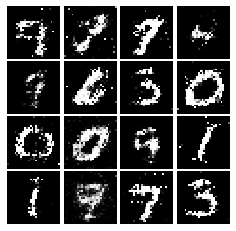

Epoch: 6, Iter: 3120, D: 1.274, G:0.9173


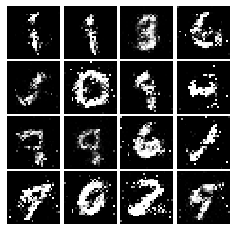

Epoch: 6, Iter: 3140, D: 1.339, G:0.783


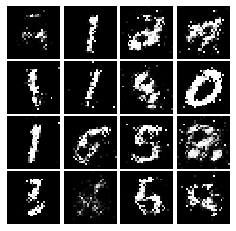

Epoch: 6, Iter: 3160, D: 1.199, G:0.9689


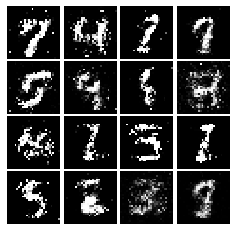

Epoch: 6, Iter: 3180, D: 1.207, G:0.8641


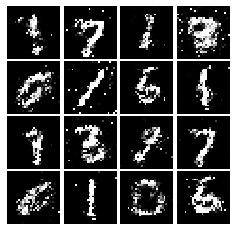

Epoch: 6, Iter: 3200, D: 1.291, G:0.9063


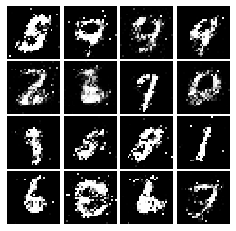

Epoch: 6, Iter: 3220, D: 1.319, G:0.7884


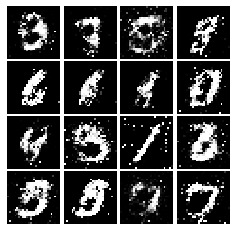

Epoch: 6, Iter: 3240, D: 1.289, G:0.8312


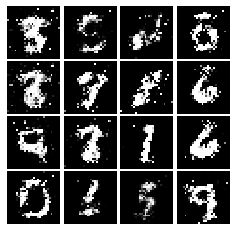

Epoch: 6, Iter: 3260, D: 1.375, G:0.8434


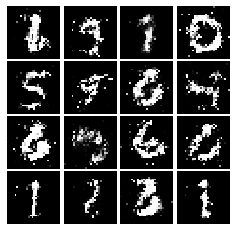

Epoch: 6, Iter: 3280, D: 1.355, G:0.9602


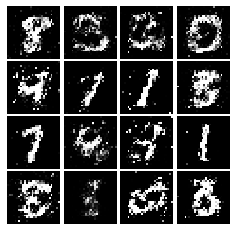

Epoch: 7, Iter: 3300, D: 1.28, G:0.8518


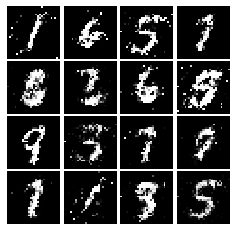

Epoch: 7, Iter: 3320, D: 1.231, G:0.7249


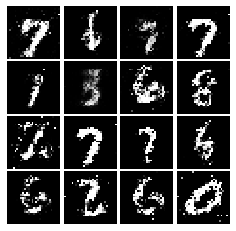

Epoch: 7, Iter: 3340, D: 1.266, G:0.9441


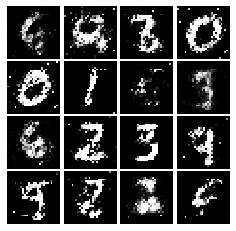

Epoch: 7, Iter: 3360, D: 1.3, G:0.8659


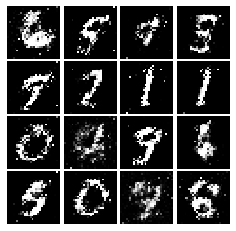

Epoch: 7, Iter: 3380, D: 1.299, G:0.8463


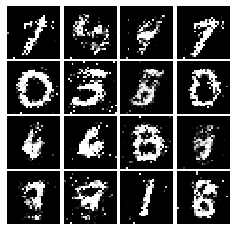

Epoch: 7, Iter: 3400, D: 1.298, G:0.8669


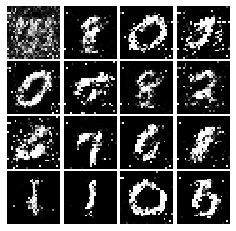

Epoch: 7, Iter: 3420, D: 1.349, G:0.8968


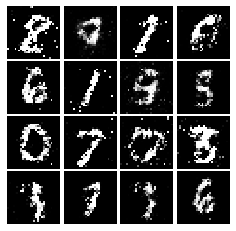

Epoch: 7, Iter: 3440, D: 1.326, G:0.9893


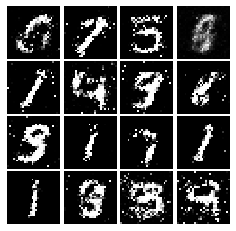

Epoch: 7, Iter: 3460, D: 1.377, G:0.9707


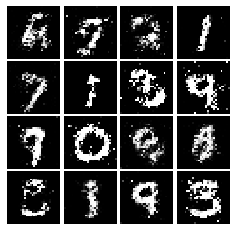

Epoch: 7, Iter: 3480, D: 1.381, G:0.7988


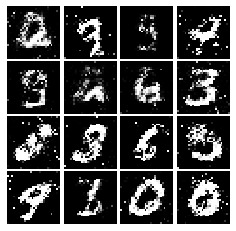

Epoch: 7, Iter: 3500, D: 1.263, G:0.8502


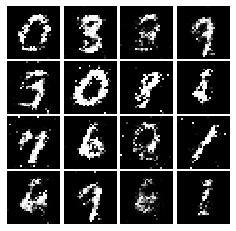

Epoch: 7, Iter: 3520, D: 1.573, G:1.172


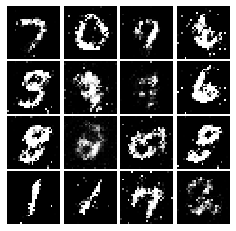

Epoch: 7, Iter: 3540, D: 1.286, G:0.7384


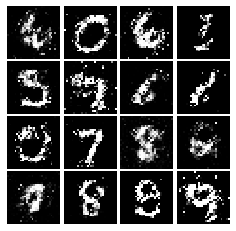

Epoch: 7, Iter: 3560, D: 1.372, G:0.8968


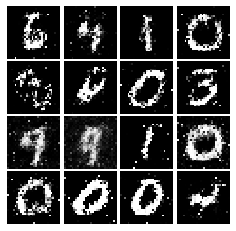

Epoch: 7, Iter: 3580, D: 1.258, G:0.8448


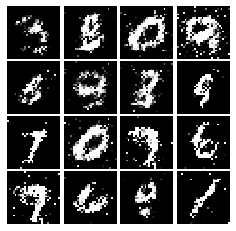

Epoch: 7, Iter: 3600, D: 1.293, G:0.7886


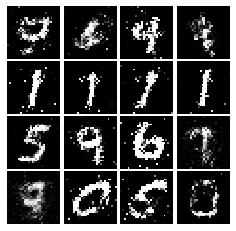

Epoch: 7, Iter: 3620, D: 1.325, G:0.7899


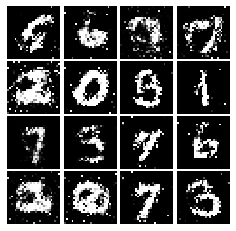

Epoch: 7, Iter: 3640, D: 1.312, G:0.8505


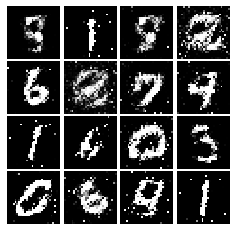

Epoch: 7, Iter: 3660, D: 1.298, G:0.825


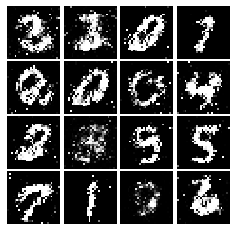

Epoch: 7, Iter: 3680, D: 1.298, G:0.9011


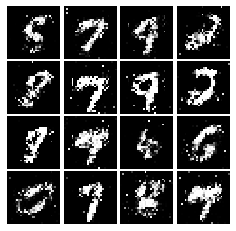

Epoch: 7, Iter: 3700, D: 1.23, G:0.8834


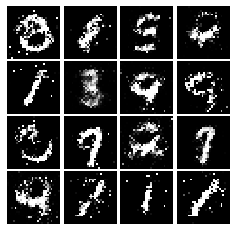

Epoch: 7, Iter: 3720, D: 1.304, G:0.8004


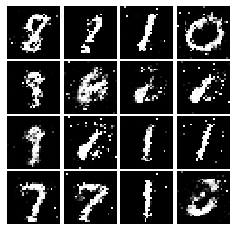

Epoch: 7, Iter: 3740, D: 1.318, G:0.8713


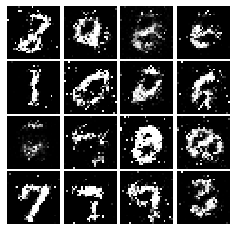

Epoch: 8, Iter: 3760, D: 1.321, G:0.8029


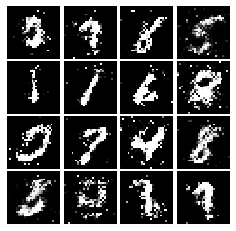

Epoch: 8, Iter: 3780, D: 1.33, G:0.8425


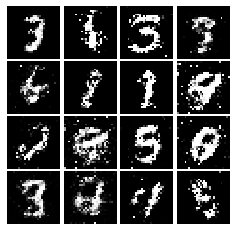

Epoch: 8, Iter: 3800, D: 1.275, G:0.8717


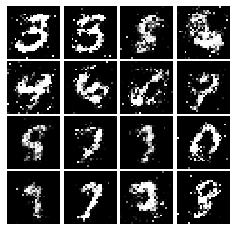

Epoch: 8, Iter: 3820, D: 1.343, G:0.9108


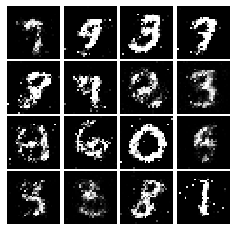

Epoch: 8, Iter: 3840, D: 1.424, G:0.8788


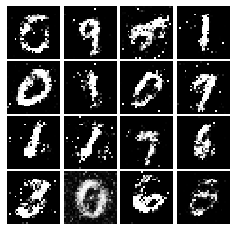

Epoch: 8, Iter: 3860, D: 1.249, G:1.246


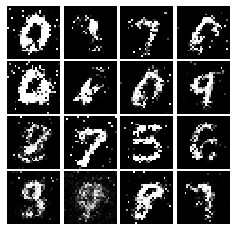

Epoch: 8, Iter: 3880, D: 1.32, G:0.824


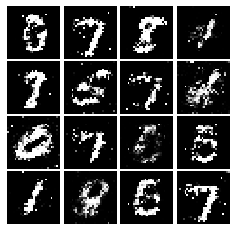

Epoch: 8, Iter: 3900, D: 1.268, G:0.8613


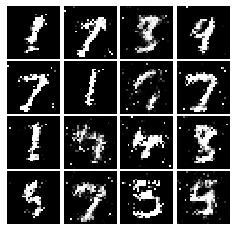

Epoch: 8, Iter: 3920, D: 1.291, G:0.8364


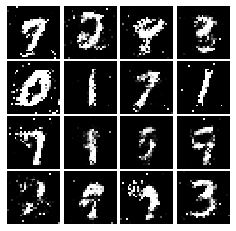

Epoch: 8, Iter: 3940, D: 1.343, G:0.8081


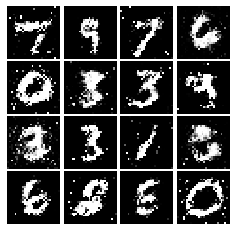

Epoch: 8, Iter: 3960, D: 1.385, G:0.7537


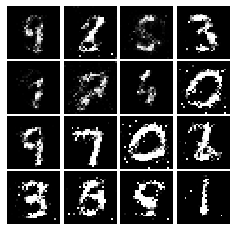

Epoch: 8, Iter: 3980, D: 1.284, G:0.83


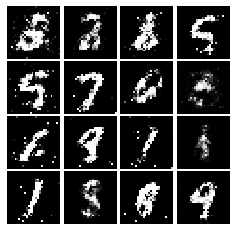

Epoch: 8, Iter: 4000, D: 1.295, G:0.8069


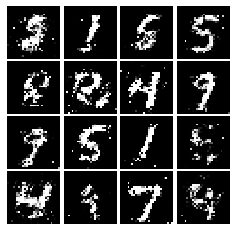

Epoch: 8, Iter: 4020, D: 1.294, G:0.7101


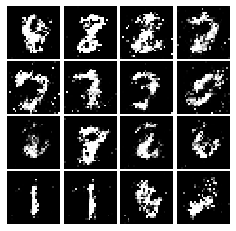

Epoch: 8, Iter: 4040, D: 1.273, G:0.7705


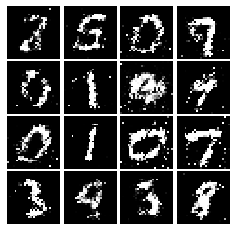

Epoch: 8, Iter: 4060, D: 1.299, G:0.8002


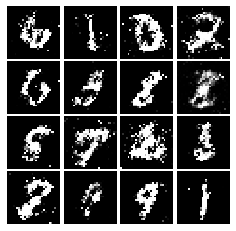

Epoch: 8, Iter: 4080, D: 1.251, G:0.7519


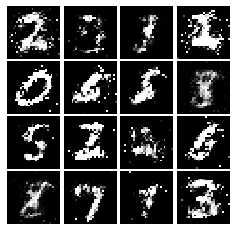

Epoch: 8, Iter: 4100, D: 1.308, G:0.7517


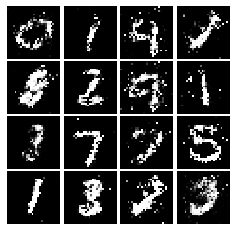

Epoch: 8, Iter: 4120, D: 1.359, G:0.8548


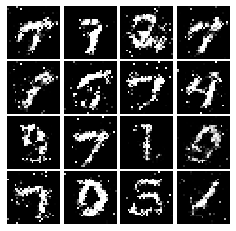

Epoch: 8, Iter: 4140, D: 1.331, G:0.7927


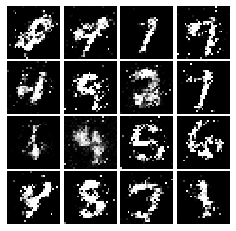

Epoch: 8, Iter: 4160, D: 1.339, G:0.809


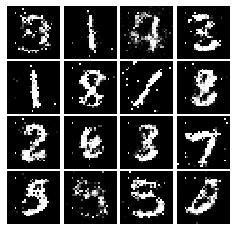

Epoch: 8, Iter: 4180, D: 1.308, G:0.8084


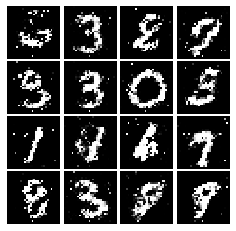

Epoch: 8, Iter: 4200, D: 1.288, G:0.7477


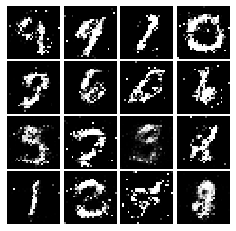

Epoch: 8, Iter: 4220, D: 1.118, G:0.8951


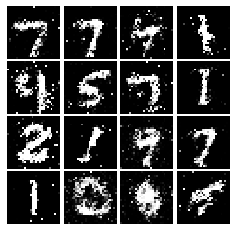

Epoch: 9, Iter: 4240, D: 1.416, G:0.7808


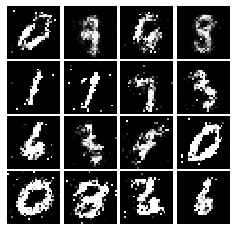

Epoch: 9, Iter: 4260, D: 1.41, G:0.7686


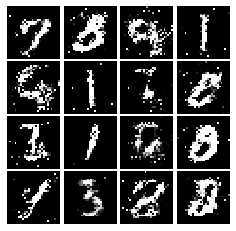

Epoch: 9, Iter: 4280, D: 1.376, G:0.8708


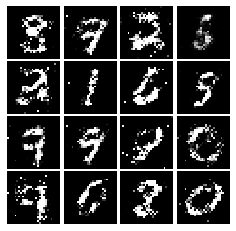

Epoch: 9, Iter: 4300, D: 1.309, G:0.8192


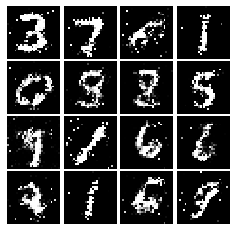

Epoch: 9, Iter: 4320, D: 1.311, G:0.7868


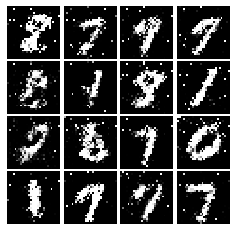

Epoch: 9, Iter: 4340, D: 1.365, G:0.8197


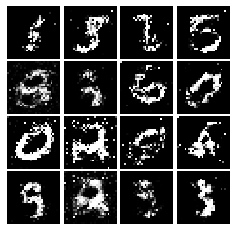

Epoch: 9, Iter: 4360, D: 1.295, G:0.8664


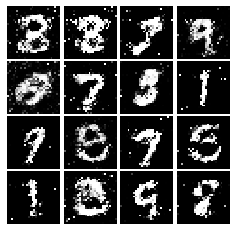

Epoch: 9, Iter: 4380, D: 1.324, G:0.839


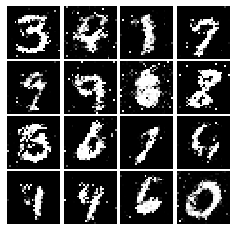

Epoch: 9, Iter: 4400, D: 1.185, G:0.8356


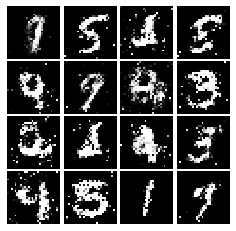

Epoch: 9, Iter: 4420, D: 1.207, G:0.8006


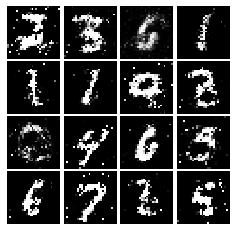

Epoch: 9, Iter: 4440, D: 1.332, G:0.8013


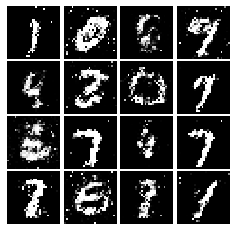

Epoch: 9, Iter: 4460, D: 1.331, G:0.7838


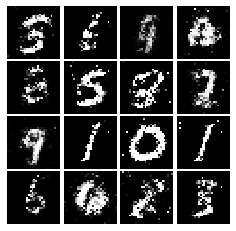

Epoch: 9, Iter: 4480, D: 1.308, G:0.8026


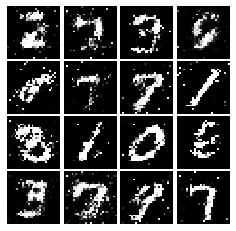

Epoch: 9, Iter: 4500, D: 1.585, G:0.8591


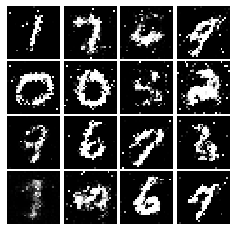

Epoch: 9, Iter: 4520, D: 1.355, G:0.8696


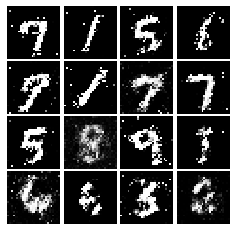

Epoch: 9, Iter: 4540, D: 1.342, G:0.8196


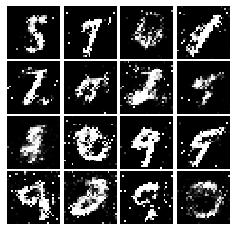

Epoch: 9, Iter: 4560, D: 1.304, G:0.9045


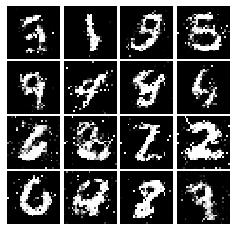

Epoch: 9, Iter: 4580, D: 1.297, G:0.8437


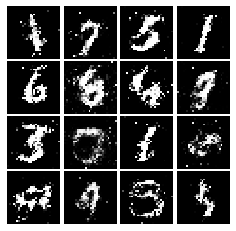

Epoch: 9, Iter: 4600, D: 1.308, G:0.8217


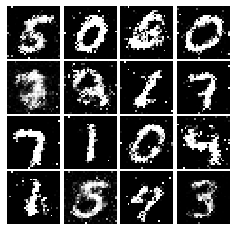

Epoch: 9, Iter: 4620, D: 1.358, G:0.8046


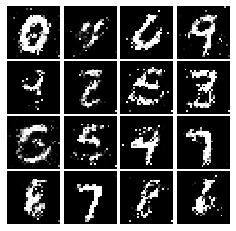

Epoch: 9, Iter: 4640, D: 1.39, G:0.8459


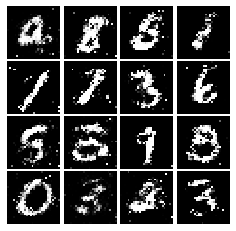

Epoch: 9, Iter: 4660, D: 1.342, G:0.8331


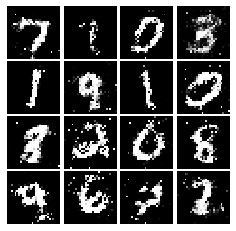

Epoch: 9, Iter: 4680, D: 1.356, G:0.9038


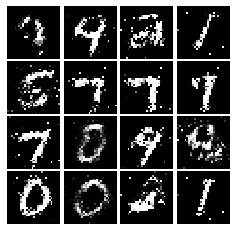

Final images


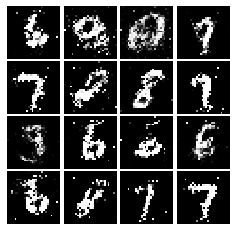

In [17]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [18]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = 0.5*tf.reduce_mean(tf.square(scores_real - 1)) + 0.5*tf.reduce_mean(tf.square(scores_fake))
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = 0.5*tf.reduce_mean((tf.square(scores_fake-1)))
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [19]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.9187, G:0.3576


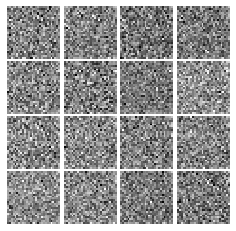

Epoch: 0, Iter: 20, D: 0.1363, G:0.8493


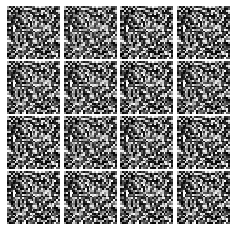

Epoch: 0, Iter: 40, D: 0.04543, G:0.7843


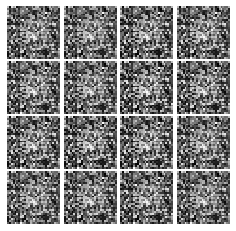

Epoch: 0, Iter: 60, D: 0.2403, G:1.251


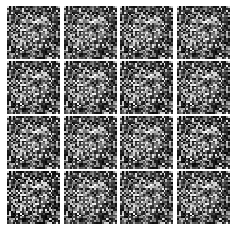

Epoch: 0, Iter: 80, D: 0.128, G:0.527


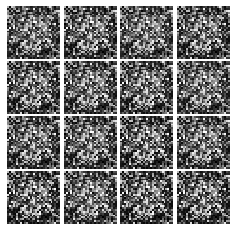

Epoch: 0, Iter: 100, D: 0.01962, G:0.7597


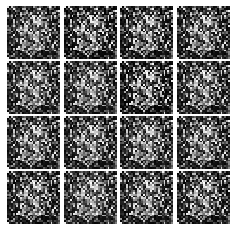

Epoch: 0, Iter: 120, D: 0.07744, G:0.7024


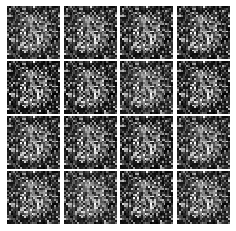

Epoch: 0, Iter: 140, D: 0.1368, G:0.5541


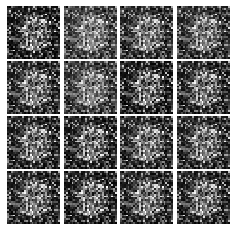

Epoch: 0, Iter: 160, D: 0.1341, G:0.6109


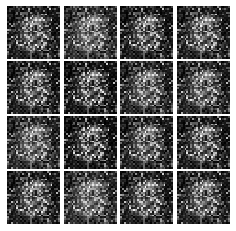

Epoch: 0, Iter: 180, D: 0.04053, G:0.6176


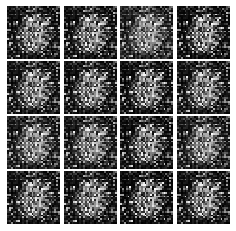

Epoch: 0, Iter: 200, D: 0.115, G:0.3839


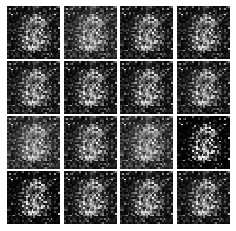

Epoch: 0, Iter: 220, D: 0.1919, G:0.2359


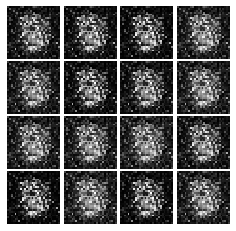

Epoch: 0, Iter: 240, D: 0.127, G:0.4041


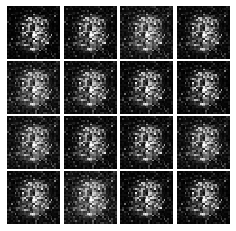

Epoch: 0, Iter: 260, D: 0.1555, G:0.435


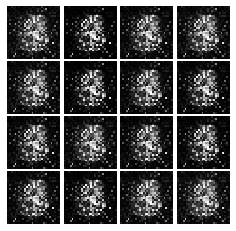

Epoch: 0, Iter: 280, D: 0.1627, G:0.1811


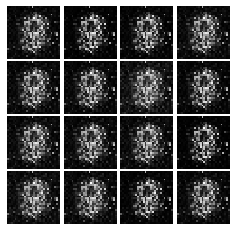

Epoch: 0, Iter: 300, D: 0.173, G:0.571


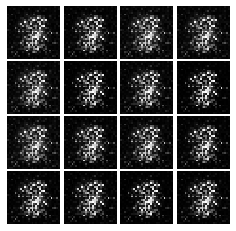

Epoch: 0, Iter: 320, D: 0.05015, G:0.6858


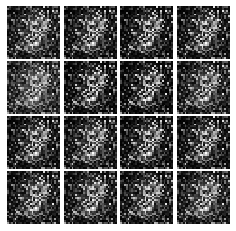

Epoch: 0, Iter: 340, D: 0.1537, G:0.8088


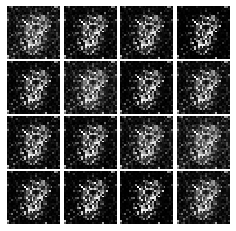

Epoch: 0, Iter: 360, D: 0.03716, G:0.5361


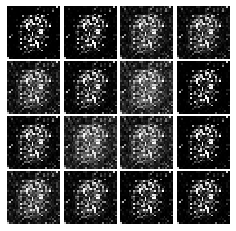

Epoch: 0, Iter: 380, D: 0.1717, G:0.6144


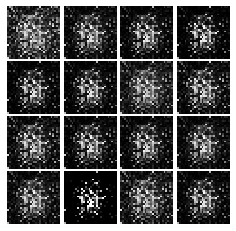

Epoch: 0, Iter: 400, D: 0.2082, G:0.2036


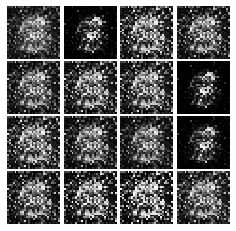

Epoch: 0, Iter: 420, D: 0.1563, G:0.3368


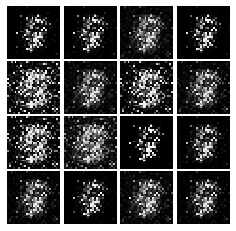

Epoch: 0, Iter: 440, D: 0.1438, G:0.3292


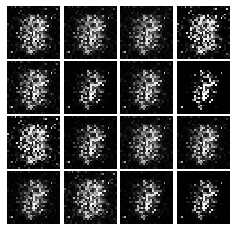

Epoch: 0, Iter: 460, D: 0.05441, G:0.4702


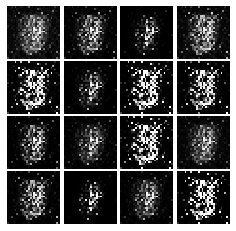

Epoch: 1, Iter: 480, D: 0.1189, G:0.4321


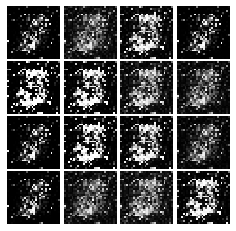

Epoch: 1, Iter: 500, D: 0.1273, G:0.494


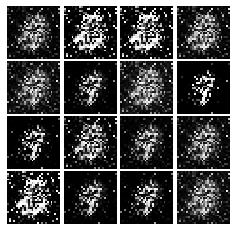

Epoch: 1, Iter: 520, D: 0.06467, G:0.4505


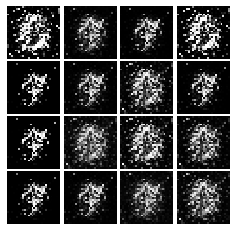

Epoch: 1, Iter: 540, D: 0.1246, G:0.5264


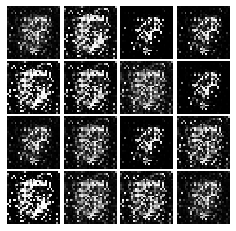

Epoch: 1, Iter: 560, D: 0.1492, G:0.561


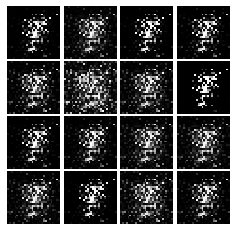

Epoch: 1, Iter: 580, D: 0.1206, G:0.368


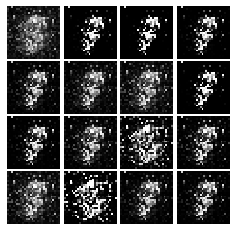

Epoch: 1, Iter: 600, D: 0.1277, G:0.3825


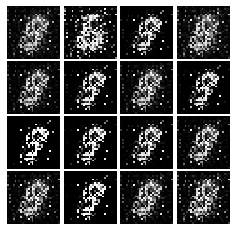

Epoch: 1, Iter: 620, D: 0.1203, G:0.4337


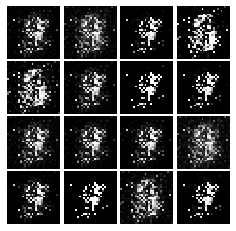

Epoch: 1, Iter: 640, D: 0.07936, G:0.5178


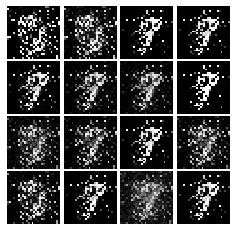

Epoch: 1, Iter: 660, D: 0.07609, G:0.4669


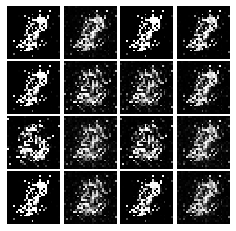

Epoch: 1, Iter: 680, D: 0.1156, G:0.5329


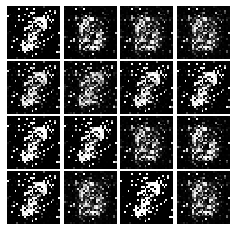

Epoch: 1, Iter: 700, D: 0.07474, G:0.5072


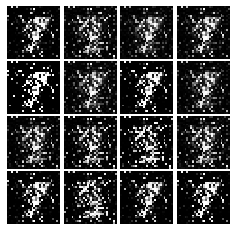

Epoch: 1, Iter: 720, D: 0.2207, G:0.5539


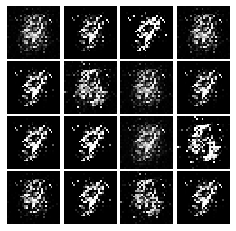

Epoch: 1, Iter: 740, D: 0.09093, G:0.4842


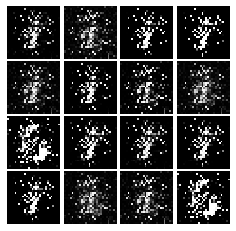

Epoch: 1, Iter: 760, D: 0.1497, G:0.3127


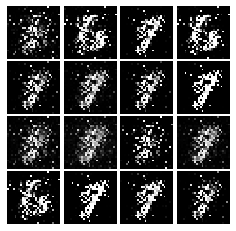

Epoch: 1, Iter: 780, D: 0.1084, G:0.5469


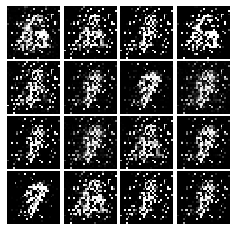

Epoch: 1, Iter: 800, D: 0.3104, G:0.1703


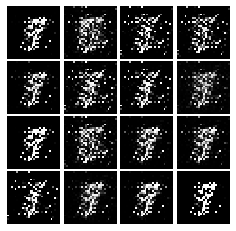

Epoch: 1, Iter: 820, D: 0.1548, G:0.6057


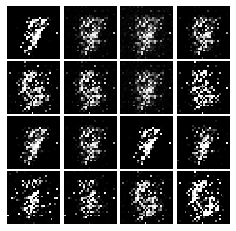

Epoch: 1, Iter: 840, D: 0.08623, G:0.4526


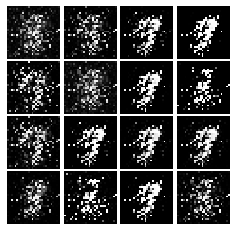

Epoch: 1, Iter: 860, D: 0.0845, G:0.3727


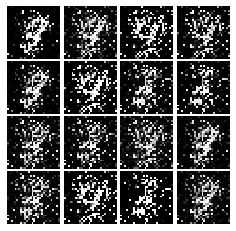

Epoch: 1, Iter: 880, D: 0.1191, G:0.3412


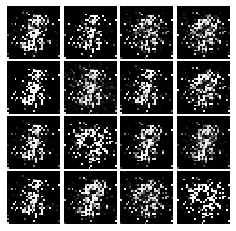

Epoch: 1, Iter: 900, D: 0.1005, G:0.35


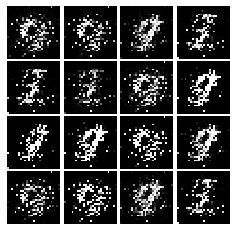

Epoch: 1, Iter: 920, D: 0.1347, G:0.5238


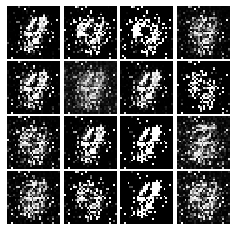

Epoch: 2, Iter: 940, D: 0.06049, G:0.6517


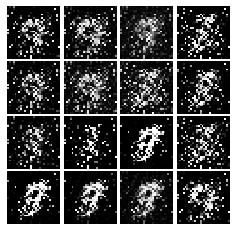

Epoch: 2, Iter: 960, D: 0.1198, G:0.3252


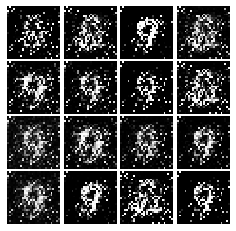

Epoch: 2, Iter: 980, D: 0.2155, G:0.2945


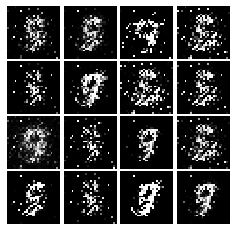

Epoch: 2, Iter: 1000, D: 0.148, G:0.3351


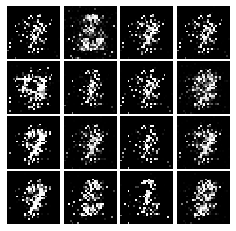

Epoch: 2, Iter: 1020, D: 0.1148, G:0.3392


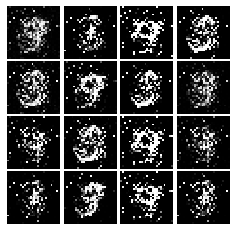

Epoch: 2, Iter: 1040, D: 0.1849, G:0.2091


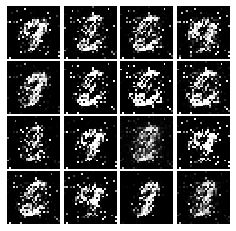

Epoch: 2, Iter: 1060, D: 0.08509, G:0.313


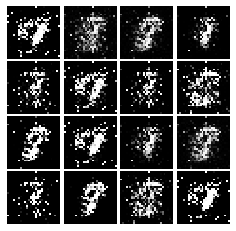

Epoch: 2, Iter: 1080, D: 0.1961, G:0.3378


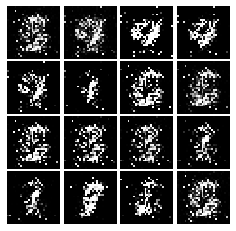

Epoch: 2, Iter: 1100, D: 0.1772, G:0.3158


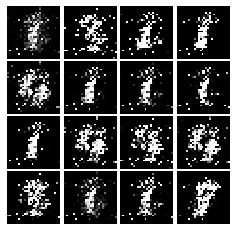

Epoch: 2, Iter: 1120, D: 0.09802, G:0.5167


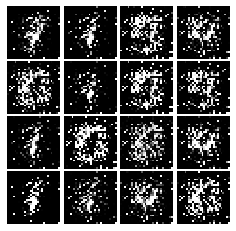

Epoch: 2, Iter: 1140, D: 0.1306, G:0.5135


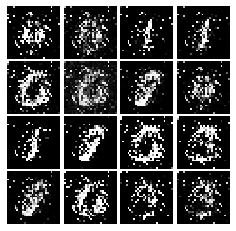

Epoch: 2, Iter: 1160, D: 0.1172, G:0.3081


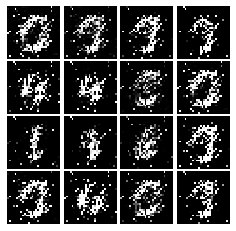

Epoch: 2, Iter: 1180, D: 0.1007, G:0.4808


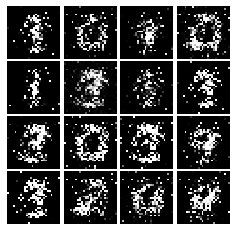

Epoch: 2, Iter: 1200, D: 0.123, G:0.3582


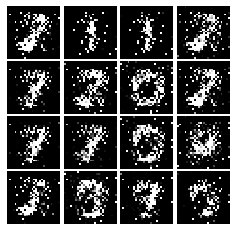

Epoch: 2, Iter: 1220, D: 0.1474, G:0.3385


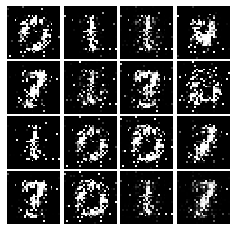

Epoch: 2, Iter: 1240, D: 0.1057, G:0.333


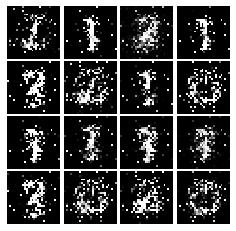

Epoch: 2, Iter: 1260, D: 0.1336, G:0.3726


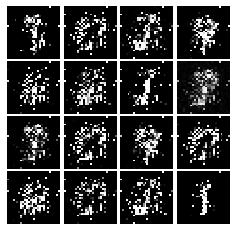

Epoch: 2, Iter: 1280, D: 0.1325, G:0.3037


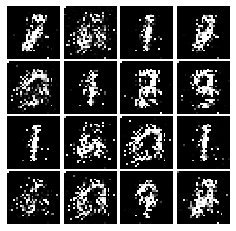

Epoch: 2, Iter: 1300, D: 0.172, G:0.1854


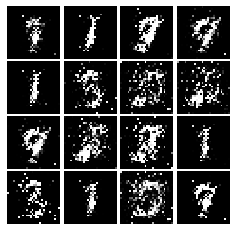

Epoch: 2, Iter: 1320, D: 0.1598, G:0.3656


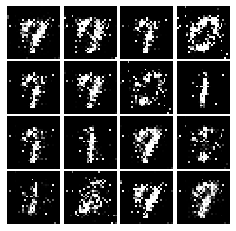

Epoch: 2, Iter: 1340, D: 0.124, G:0.2894


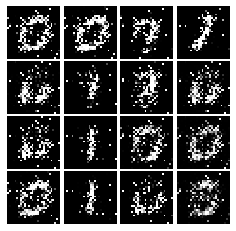

Epoch: 2, Iter: 1360, D: 0.1543, G:0.2165


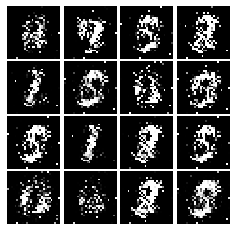

Epoch: 2, Iter: 1380, D: 0.1897, G:0.2867


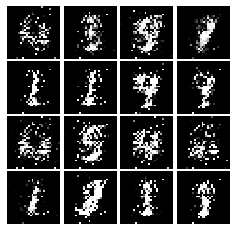

Epoch: 2, Iter: 1400, D: 0.1362, G:0.5558


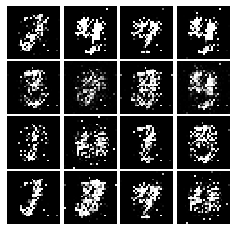

Epoch: 3, Iter: 1420, D: 0.1476, G:0.2074


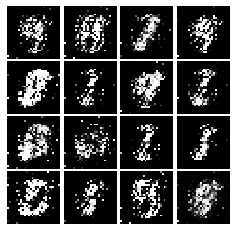

Epoch: 3, Iter: 1440, D: 0.1681, G:0.2643


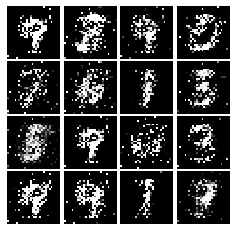

Epoch: 3, Iter: 1460, D: 0.1937, G:0.2675


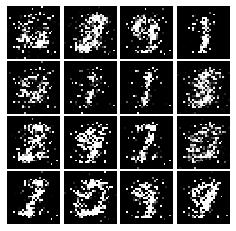

Epoch: 3, Iter: 1480, D: 0.1334, G:0.3652


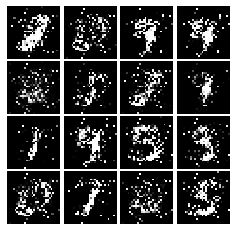

Epoch: 3, Iter: 1500, D: 0.1262, G:0.3059


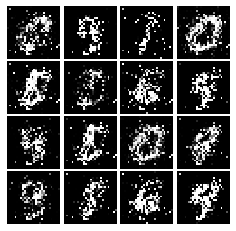

Epoch: 3, Iter: 1520, D: 0.1715, G:0.2952


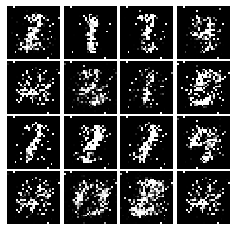

Epoch: 3, Iter: 1540, D: 0.136, G:0.3646


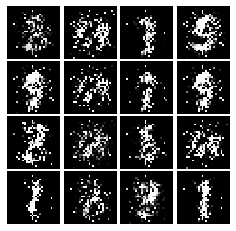

Epoch: 3, Iter: 1560, D: 0.1551, G:0.2081


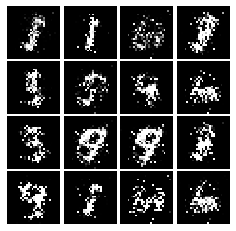

Epoch: 3, Iter: 1580, D: 0.1657, G:0.3545


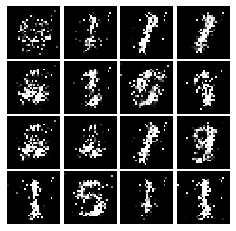

Epoch: 3, Iter: 1600, D: 0.1969, G:0.1808


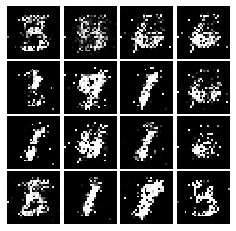

Epoch: 3, Iter: 1620, D: 0.1146, G:0.3026


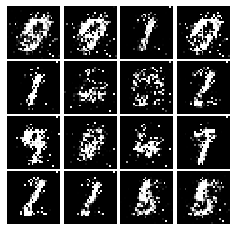

Epoch: 3, Iter: 1640, D: 0.1571, G:0.4223


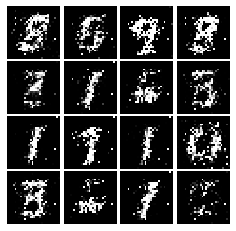

Epoch: 3, Iter: 1660, D: 0.1335, G:0.3412


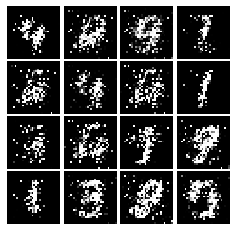

Epoch: 3, Iter: 1680, D: 0.1909, G:0.2602


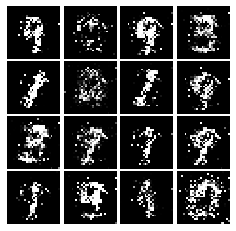

Epoch: 3, Iter: 1700, D: 0.2185, G:0.3021


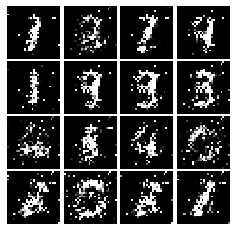

Epoch: 3, Iter: 1720, D: 0.1963, G:0.2295


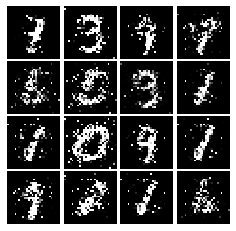

Epoch: 3, Iter: 1740, D: 0.1778, G:0.262


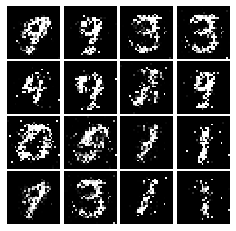

Epoch: 3, Iter: 1760, D: 0.1303, G:0.4721


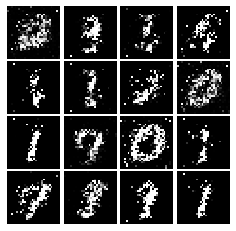

Epoch: 3, Iter: 1780, D: 0.1438, G:0.2893


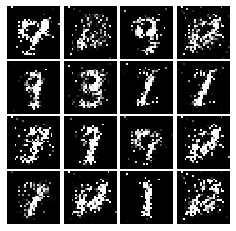

Epoch: 3, Iter: 1800, D: 0.1533, G:0.2541


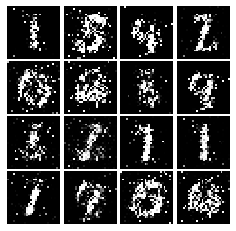

Epoch: 3, Iter: 1820, D: 0.1913, G:0.2562


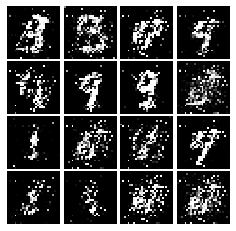

Epoch: 3, Iter: 1840, D: 0.1838, G:0.2578


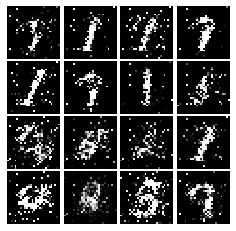

Epoch: 3, Iter: 1860, D: 0.1635, G:0.2537


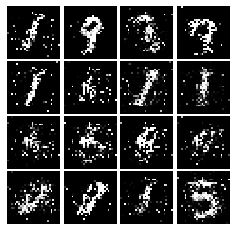

Epoch: 4, Iter: 1880, D: 0.281, G:0.1927


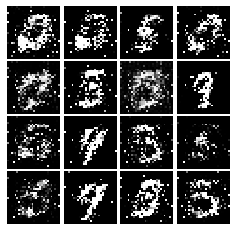

Epoch: 4, Iter: 1900, D: 0.1755, G:0.3673


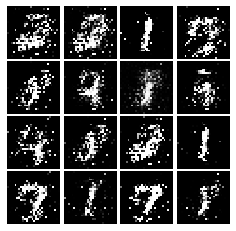

Epoch: 4, Iter: 1920, D: 0.189, G:0.132


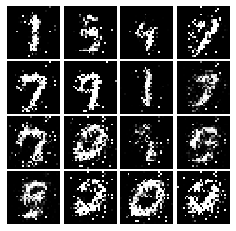

Epoch: 4, Iter: 1940, D: 0.1848, G:0.2336


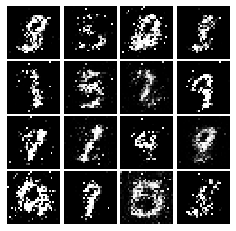

Epoch: 4, Iter: 1960, D: 0.1627, G:0.2136


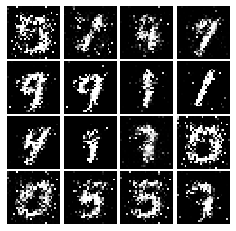

Epoch: 4, Iter: 1980, D: 0.1777, G:0.2278


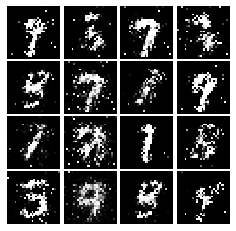

Epoch: 4, Iter: 2000, D: 0.1992, G:0.2196


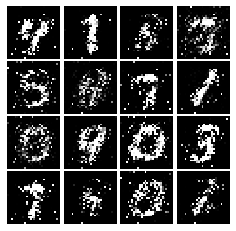

Epoch: 4, Iter: 2020, D: 0.1998, G:0.1769


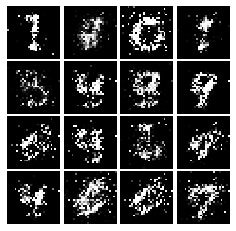

Epoch: 4, Iter: 2040, D: 0.2005, G:0.2006


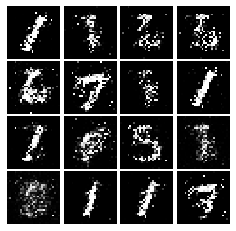

Epoch: 4, Iter: 2060, D: 0.1748, G:0.219


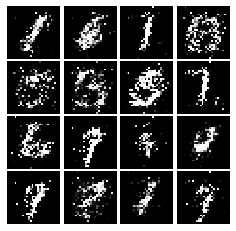

Epoch: 4, Iter: 2080, D: 0.1804, G:0.2348


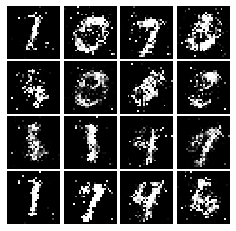

Epoch: 4, Iter: 2100, D: 0.2482, G:0.1809


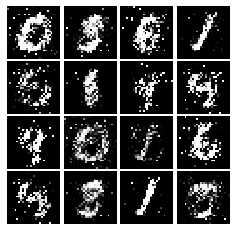

Epoch: 4, Iter: 2120, D: 0.2061, G:0.2582


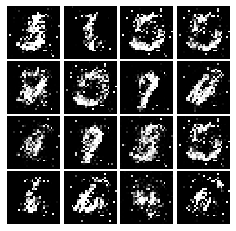

Epoch: 4, Iter: 2140, D: 0.1852, G:0.2832


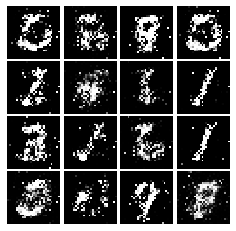

Epoch: 4, Iter: 2160, D: 0.2215, G:0.2253


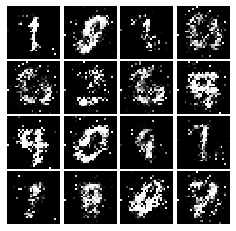

Epoch: 4, Iter: 2180, D: 0.1951, G:0.2372


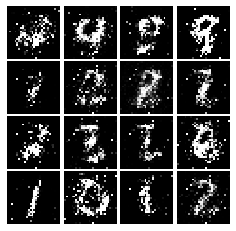

Epoch: 4, Iter: 2200, D: 0.1707, G:0.2371


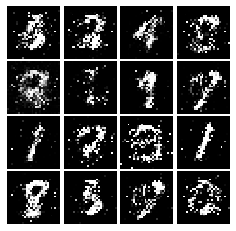

Epoch: 4, Iter: 2220, D: 0.2007, G:0.2649


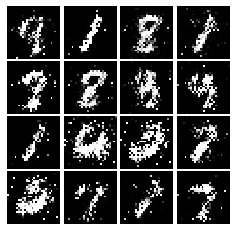

Epoch: 4, Iter: 2240, D: 0.2016, G:0.1779


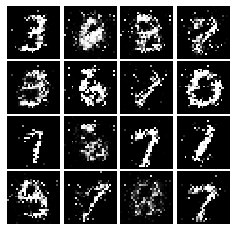

Epoch: 4, Iter: 2260, D: 0.2004, G:0.2166


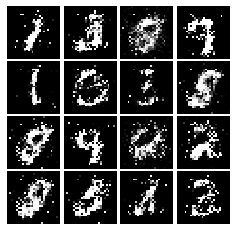

Epoch: 4, Iter: 2280, D: 0.1698, G:0.2496


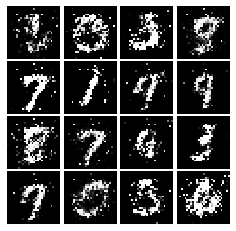

Epoch: 4, Iter: 2300, D: 0.2064, G:0.2136


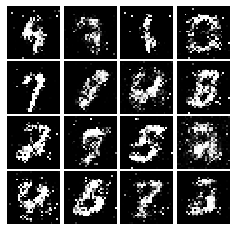

Epoch: 4, Iter: 2320, D: 0.1939, G:0.2153


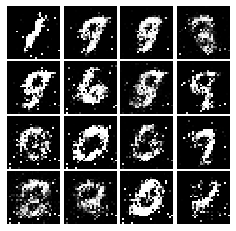

Epoch: 4, Iter: 2340, D: 0.177, G:0.3249


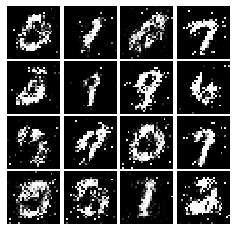

Epoch: 5, Iter: 2360, D: 0.2068, G:0.2032


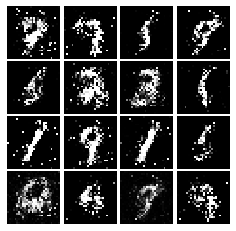

Epoch: 5, Iter: 2380, D: 0.2286, G:0.2027


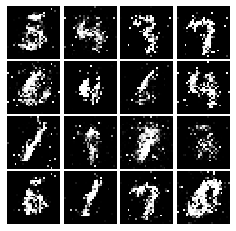

Epoch: 5, Iter: 2400, D: 0.1915, G:0.2235


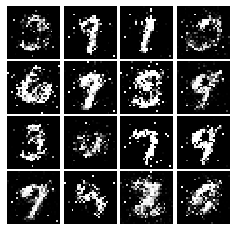

Epoch: 5, Iter: 2420, D: 0.2008, G:0.1917


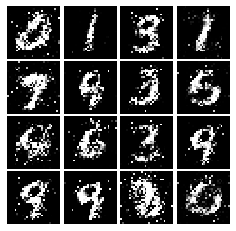

Epoch: 5, Iter: 2440, D: 0.2047, G:0.1905


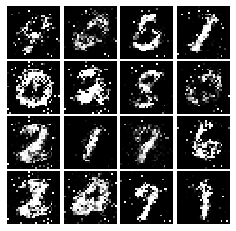

Epoch: 5, Iter: 2460, D: 0.1758, G:0.1824


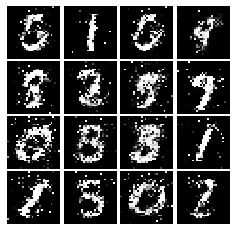

Epoch: 5, Iter: 2480, D: 0.2006, G:0.2104


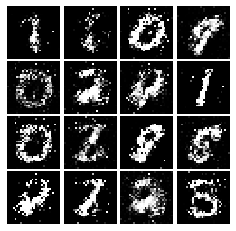

Epoch: 5, Iter: 2500, D: 0.1766, G:0.2001


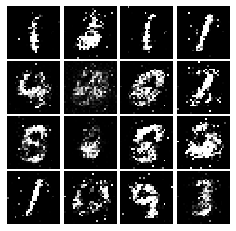

Epoch: 5, Iter: 2520, D: 0.2342, G:0.2242


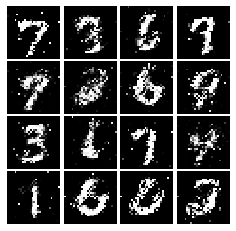

Epoch: 5, Iter: 2540, D: 0.2227, G:0.1708


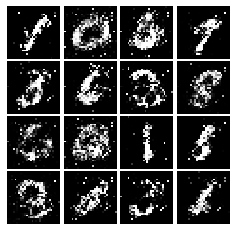

Epoch: 5, Iter: 2560, D: 0.2291, G:0.1982


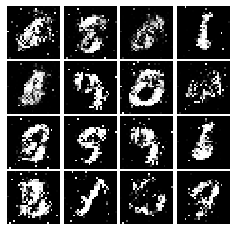

Epoch: 5, Iter: 2580, D: 0.2037, G:0.1986


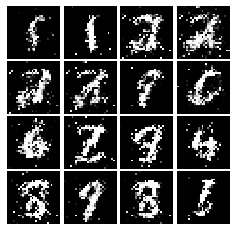

Epoch: 5, Iter: 2600, D: 0.2313, G:0.1614


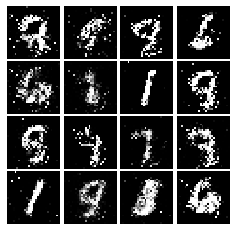

Epoch: 5, Iter: 2620, D: 0.2001, G:0.2046


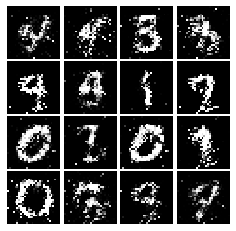

Epoch: 5, Iter: 2640, D: 0.2076, G:0.1881


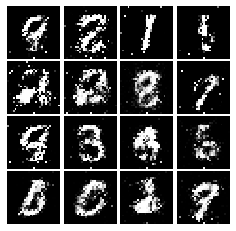

Epoch: 5, Iter: 2660, D: 0.2519, G:0.1816


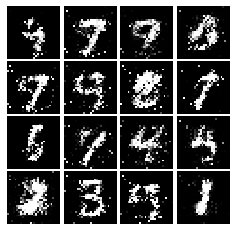

Epoch: 5, Iter: 2680, D: 0.2659, G:0.1918


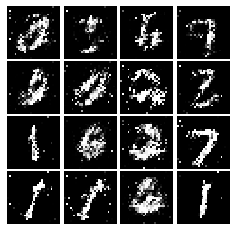

Epoch: 5, Iter: 2700, D: 0.2337, G:0.2288


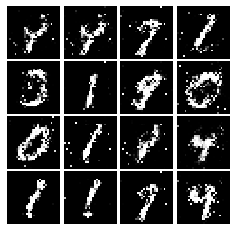

Epoch: 5, Iter: 2720, D: 0.2277, G:0.183


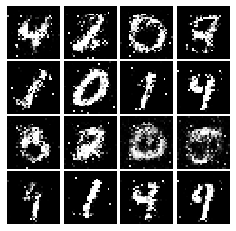

Epoch: 5, Iter: 2740, D: 0.2008, G:0.1876


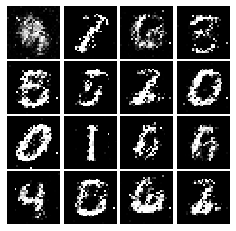

Epoch: 5, Iter: 2760, D: 0.2113, G:0.1782


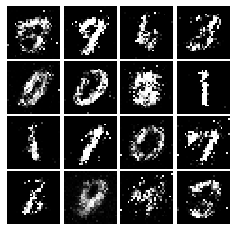

Epoch: 5, Iter: 2780, D: 0.2074, G:0.179


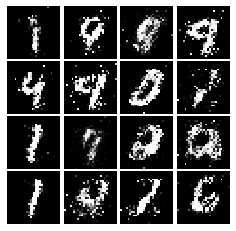

Epoch: 5, Iter: 2800, D: 0.1826, G:0.1925


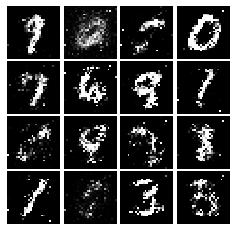

Epoch: 6, Iter: 2820, D: 0.212, G:0.1982


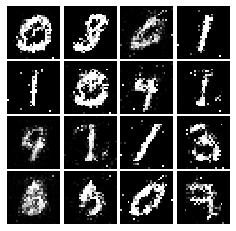

Epoch: 6, Iter: 2840, D: 0.2386, G:0.1515


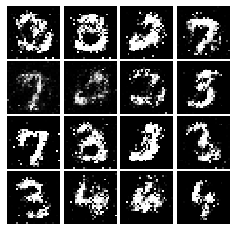

Epoch: 6, Iter: 2860, D: 0.1888, G:0.1922


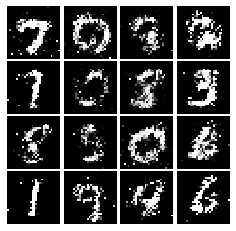

Epoch: 6, Iter: 2880, D: 0.2145, G:0.2073


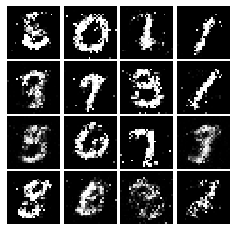

Epoch: 6, Iter: 2900, D: 0.2127, G:0.1945


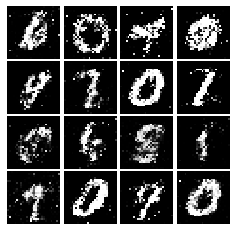

Epoch: 6, Iter: 2920, D: 0.2261, G:0.1717


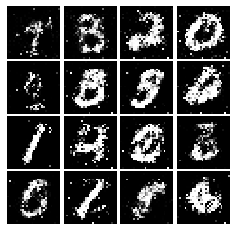

Epoch: 6, Iter: 2940, D: 0.2226, G:0.1614


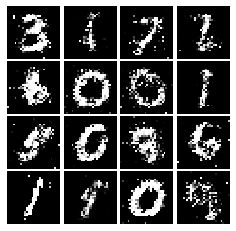

Epoch: 6, Iter: 2960, D: 0.2443, G:0.174


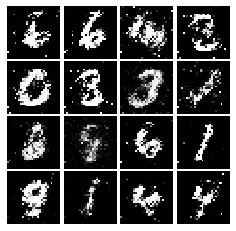

Epoch: 6, Iter: 2980, D: 0.2368, G:0.1553


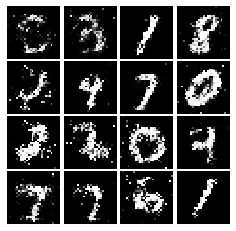

Epoch: 6, Iter: 3000, D: 0.2043, G:0.1653


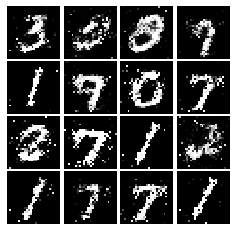

Epoch: 6, Iter: 3020, D: 0.2251, G:0.1692


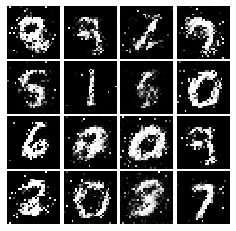

Epoch: 6, Iter: 3040, D: 0.2179, G:0.1609


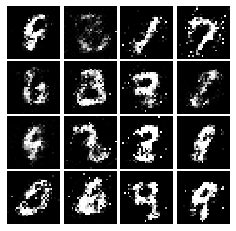

Epoch: 6, Iter: 3060, D: 0.2198, G:0.1614


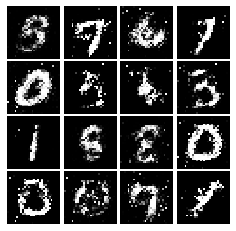

Epoch: 6, Iter: 3080, D: 0.2028, G:0.1955


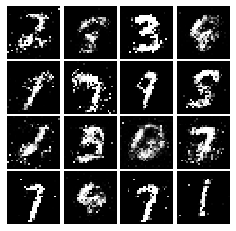

Epoch: 6, Iter: 3100, D: 0.2256, G:0.1492


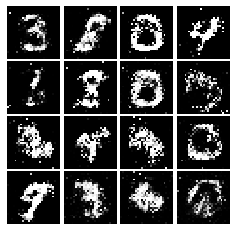

Epoch: 6, Iter: 3120, D: 0.24, G:0.1572


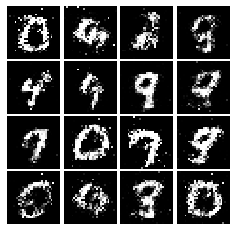

Epoch: 6, Iter: 3140, D: 0.2514, G:0.1646


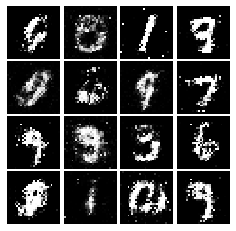

Epoch: 6, Iter: 3160, D: 0.2281, G:0.215


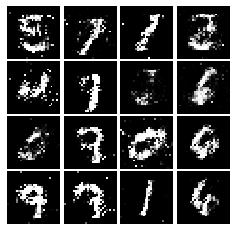

Epoch: 6, Iter: 3180, D: 0.2327, G:0.1711


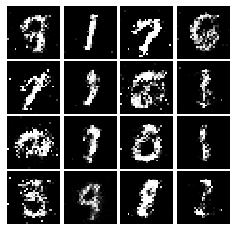

Epoch: 6, Iter: 3200, D: 0.2281, G:0.1813


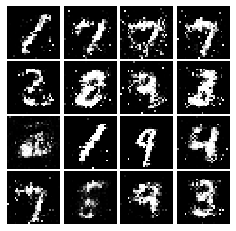

Epoch: 6, Iter: 3220, D: 0.2323, G:0.1575


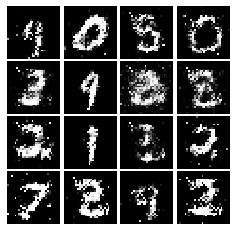

Epoch: 6, Iter: 3240, D: 0.1983, G:0.1534


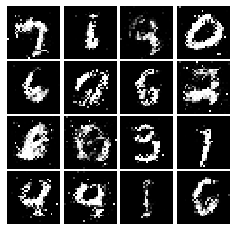

Epoch: 6, Iter: 3260, D: 0.2541, G:0.1858


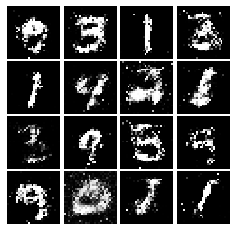

Epoch: 6, Iter: 3280, D: 0.4264, G:0.1601


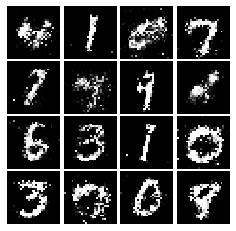

Epoch: 7, Iter: 3300, D: 0.2167, G:0.1772


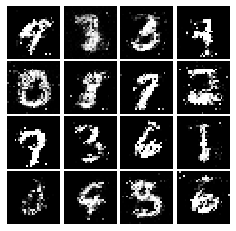

Epoch: 7, Iter: 3320, D: 0.1915, G:0.1796


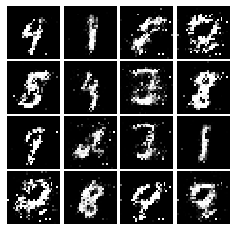

Epoch: 7, Iter: 3340, D: 0.2185, G:0.1889


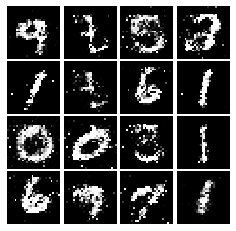

Epoch: 7, Iter: 3360, D: 0.2484, G:0.1822


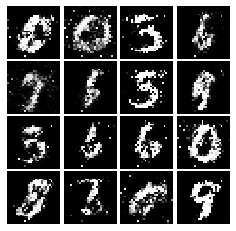

Epoch: 7, Iter: 3380, D: 0.2389, G:0.1731


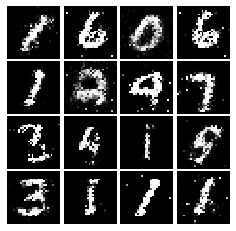

Epoch: 7, Iter: 3400, D: 0.2422, G:0.1858


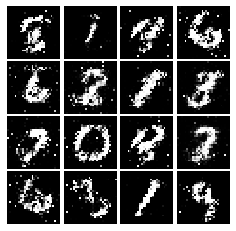

Epoch: 7, Iter: 3420, D: 0.2416, G:0.1676


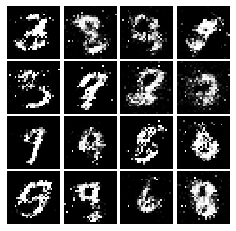

Epoch: 7, Iter: 3440, D: 0.2454, G:0.2118


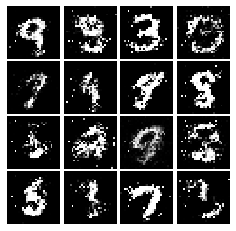

Epoch: 7, Iter: 3460, D: 0.2351, G:0.1781


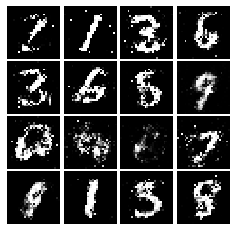

Epoch: 7, Iter: 3480, D: 0.2507, G:0.1521


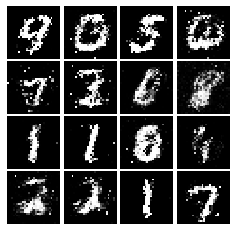

Epoch: 7, Iter: 3500, D: 0.2293, G:0.1953


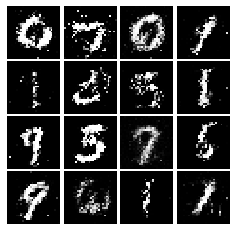

Epoch: 7, Iter: 3520, D: 0.2451, G:0.1568


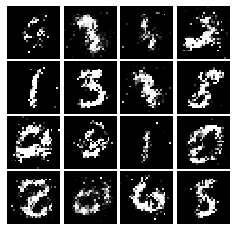

Epoch: 7, Iter: 3540, D: 0.2387, G:0.17


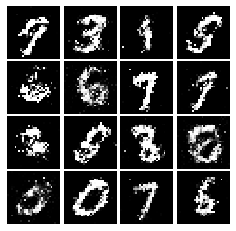

Epoch: 7, Iter: 3560, D: 0.2591, G:0.162


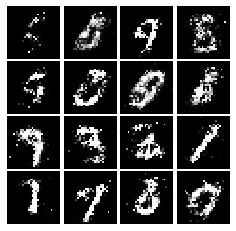

Epoch: 7, Iter: 3580, D: 0.2268, G:0.2031


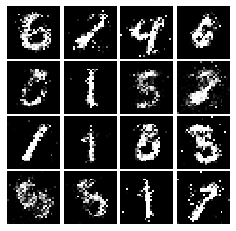

Epoch: 7, Iter: 3600, D: 0.2195, G:0.1591


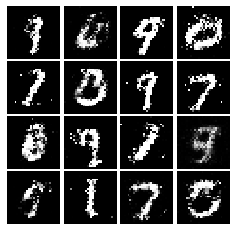

Epoch: 7, Iter: 3620, D: 0.2431, G:0.1682


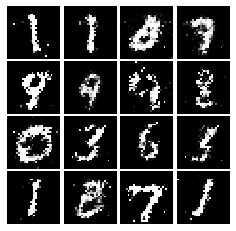

Epoch: 7, Iter: 3640, D: 0.2498, G:0.1609


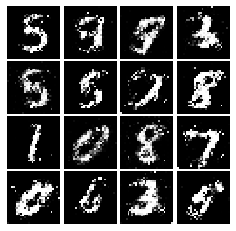

Epoch: 7, Iter: 3660, D: 0.2321, G:0.1512


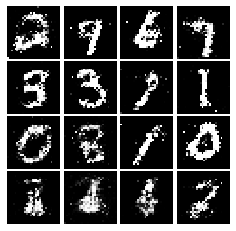

Epoch: 7, Iter: 3680, D: 0.2283, G:0.1726


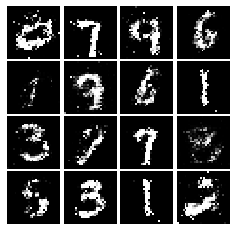

Epoch: 7, Iter: 3700, D: 0.2314, G:0.1503


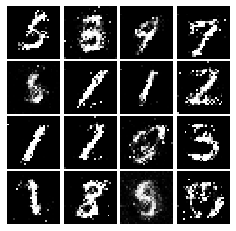

Epoch: 7, Iter: 3720, D: 0.2251, G:0.1789


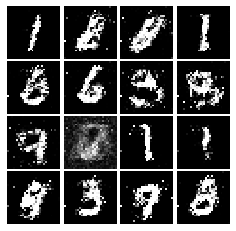

Epoch: 7, Iter: 3740, D: 0.2402, G:0.1171


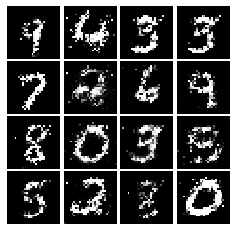

Epoch: 8, Iter: 3760, D: 0.2518, G:0.142


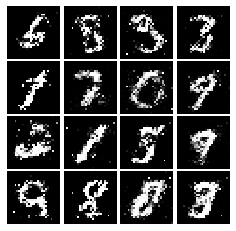

Epoch: 8, Iter: 3780, D: 0.2412, G:0.1462


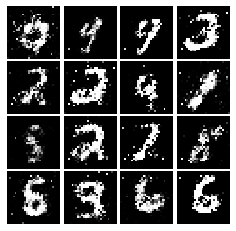

Epoch: 8, Iter: 3800, D: 0.2258, G:0.1511


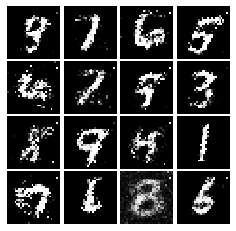

Epoch: 8, Iter: 3820, D: 0.204, G:0.1787


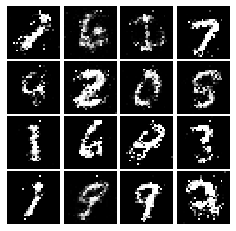

Epoch: 8, Iter: 3840, D: 0.215, G:0.1491


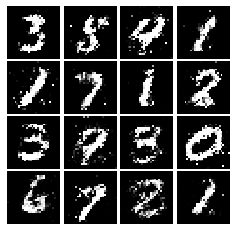

Epoch: 8, Iter: 3860, D: 0.2368, G:0.2338


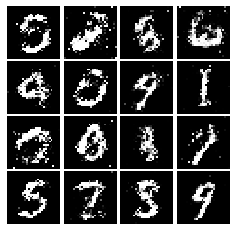

Epoch: 8, Iter: 3880, D: 0.2482, G:0.1634


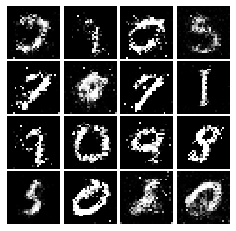

Epoch: 8, Iter: 3900, D: 0.2187, G:0.1805


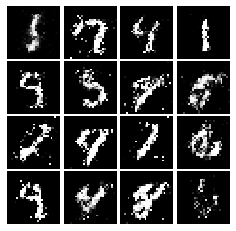

Epoch: 8, Iter: 3920, D: 0.2227, G:0.1969


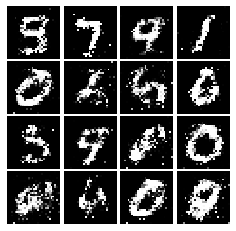

Epoch: 8, Iter: 3940, D: 0.2456, G:0.1675


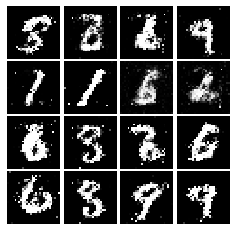

Epoch: 8, Iter: 3960, D: 0.2122, G:0.1815


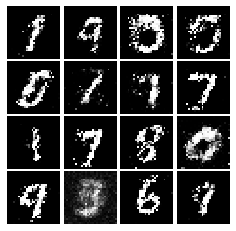

Epoch: 8, Iter: 3980, D: 0.2335, G:0.1604


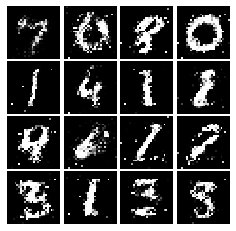

Epoch: 8, Iter: 4000, D: 0.215, G:0.1752


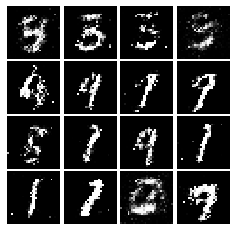

Epoch: 8, Iter: 4020, D: 0.2426, G:0.1634


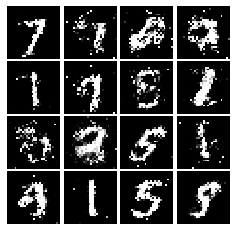

Epoch: 8, Iter: 4040, D: 0.2316, G:0.1843


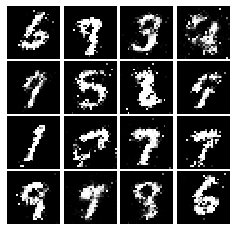

Epoch: 8, Iter: 4060, D: 0.2197, G:0.1697


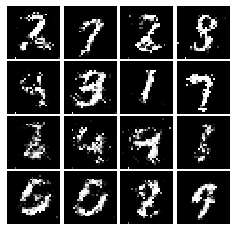

Epoch: 8, Iter: 4080, D: 0.2521, G:0.1677


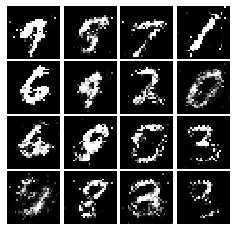

Epoch: 8, Iter: 4100, D: 0.22, G:0.1685


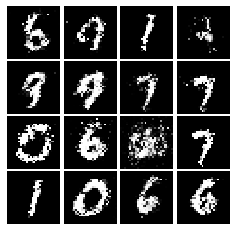

Epoch: 8, Iter: 4120, D: 0.243, G:0.1683


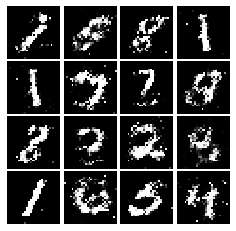

Epoch: 8, Iter: 4140, D: 0.2382, G:0.1642


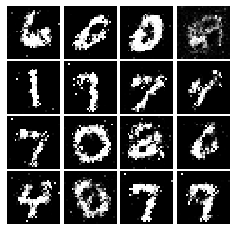

Epoch: 8, Iter: 4160, D: 0.2359, G:0.1537


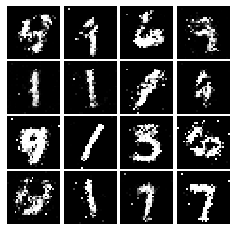

Epoch: 8, Iter: 4180, D: 0.2353, G:0.163


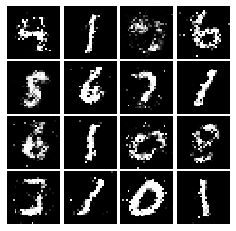

Epoch: 8, Iter: 4200, D: 0.2467, G:0.1459


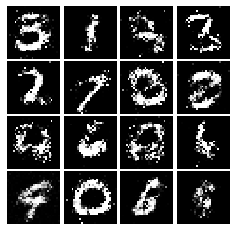

Epoch: 8, Iter: 4220, D: 0.214, G:0.1936


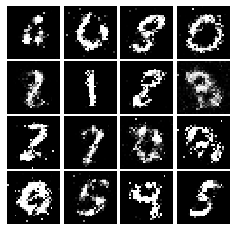

Epoch: 9, Iter: 4240, D: 0.2458, G:0.1652


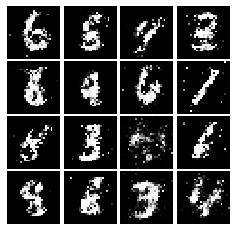

Epoch: 9, Iter: 4260, D: 0.2381, G:0.1768


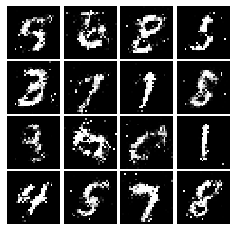

Epoch: 9, Iter: 4280, D: 0.2171, G:0.1541


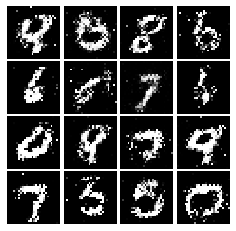

Epoch: 9, Iter: 4300, D: 0.2463, G:0.1676


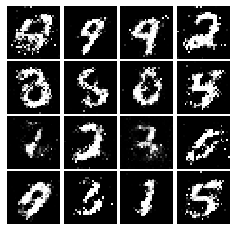

Epoch: 9, Iter: 4320, D: 0.2513, G:0.1587


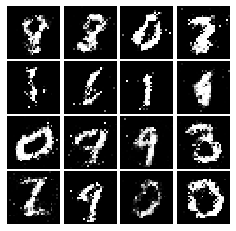

Epoch: 9, Iter: 4340, D: 0.2405, G:0.1596


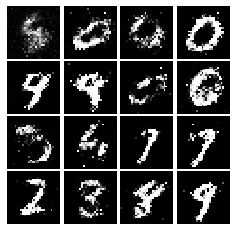

Epoch: 9, Iter: 4360, D: 0.2432, G:0.1522


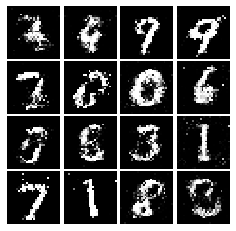

Epoch: 9, Iter: 4380, D: 0.2197, G:0.1781


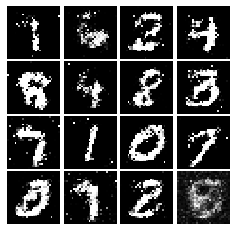

Epoch: 9, Iter: 4400, D: 0.2145, G:0.2179


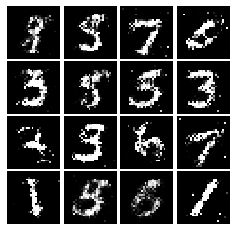

Epoch: 9, Iter: 4420, D: 0.2304, G:0.1951


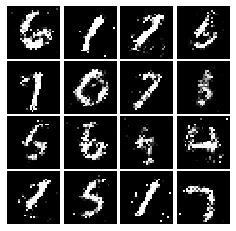

Epoch: 9, Iter: 4440, D: 0.2289, G:0.1631


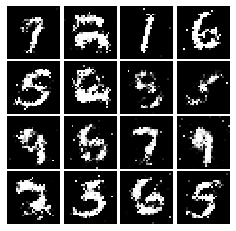

Epoch: 9, Iter: 4460, D: 0.2302, G:0.1634


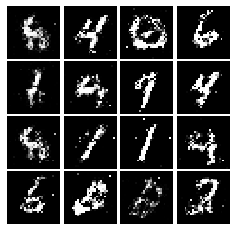

Epoch: 9, Iter: 4480, D: 0.24, G:0.1691


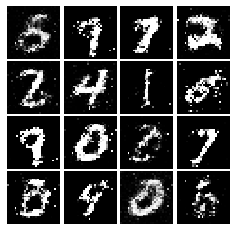

Epoch: 9, Iter: 4500, D: 0.269, G:0.1535


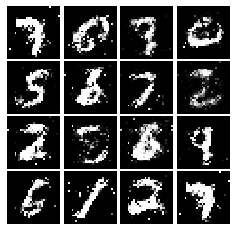

Epoch: 9, Iter: 4520, D: 0.231, G:0.1567


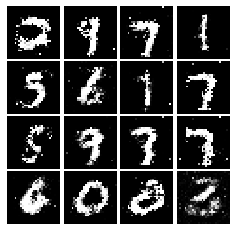

Epoch: 9, Iter: 4540, D: 0.2483, G:0.1524


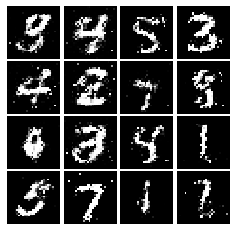

Epoch: 9, Iter: 4560, D: 0.2218, G:0.1643


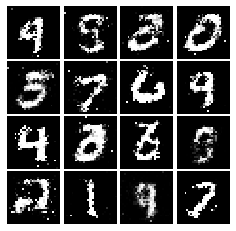

Epoch: 9, Iter: 4580, D: 0.2234, G:0.2076


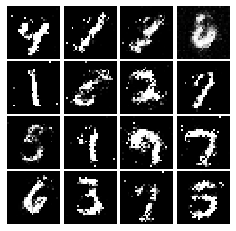

Epoch: 9, Iter: 4600, D: 0.2106, G:0.1888


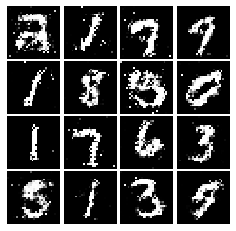

Epoch: 9, Iter: 4620, D: 0.2188, G:0.1803


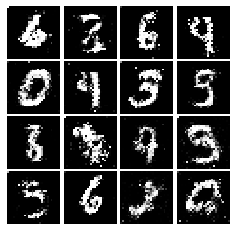

Epoch: 9, Iter: 4640, D: 0.2306, G:0.1454


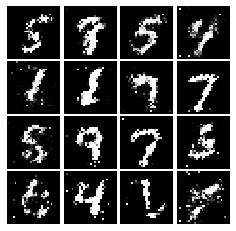

Epoch: 9, Iter: 4660, D: 0.2236, G:0.1661


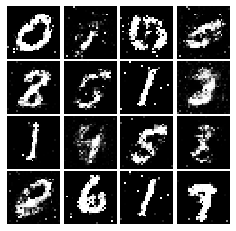

Epoch: 9, Iter: 4680, D: 0.2243, G:0.1789


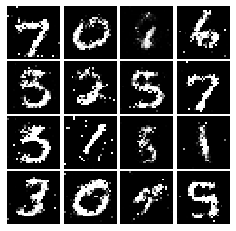

Final images


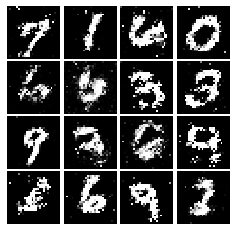

In [20]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [21]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Reshape((28,28,1)),
        tf.keras.layers.Conv2D(32,(5,5),strides = 1,padding = 'VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2),strides = 2),
        tf.keras.layers.Conv2D(64,(5,5),strides = 1,padding = 'VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2),strides = 2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [22]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    tf.keras.layers.InputLayer(noise_dim),
    tf.keras.layers.Dense(1024,activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(7*7*128,activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Reshape((7,7,128)),
    tf.keras.layers.Conv2DTranspose(filters=64,kernel_size=(4,4),strides = 2,activation = tf.nn.relu,padding = 'SAME'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(filters=1,kernel_size=(4,4),strides = 2,activation = tf.tanh,padding = 'SAME')
    ])
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.48, G:0.6497


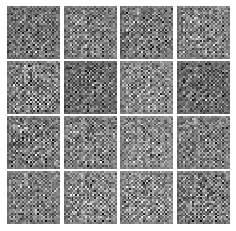

Epoch: 0, Iter: 20, D: 1.488, G:0.7065


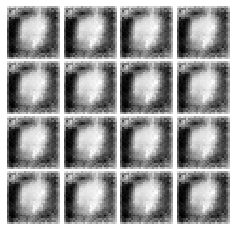

Epoch: 0, Iter: 40, D: 0.3115, G:1.522


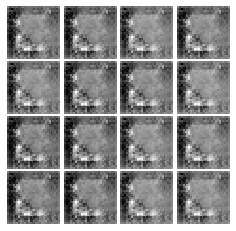

Epoch: 0, Iter: 60, D: 0.01579, G:4.306


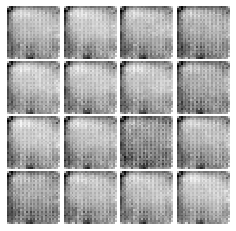

Epoch: 0, Iter: 80, D: 0.003461, G:5.829


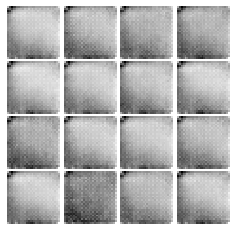

Epoch: 0, Iter: 100, D: 0.001578, G:6.566


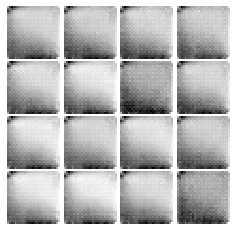

Epoch: 0, Iter: 120, D: 0.002732, G:6.957


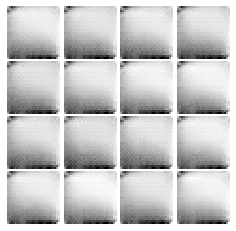

Epoch: 0, Iter: 140, D: 0.0005809, G:7.485


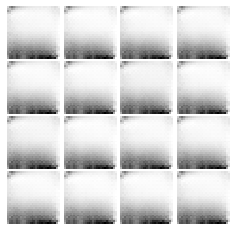

Epoch: 0, Iter: 160, D: 5.947, G:0.4085


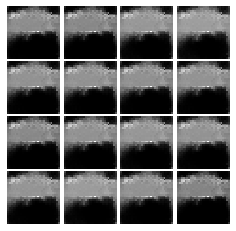

Epoch: 0, Iter: 180, D: 0.2143, G:6.246


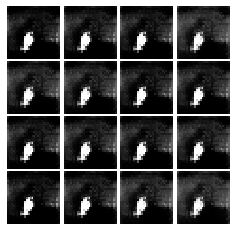

Epoch: 0, Iter: 200, D: 0.3431, G:9.514


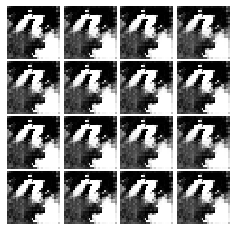

Epoch: 0, Iter: 220, D: 0.3501, G:1.82


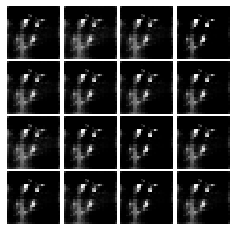

Epoch: 0, Iter: 240, D: 0.3307, G:2.806


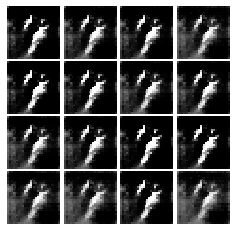

Epoch: 0, Iter: 260, D: 2.066, G:2.257


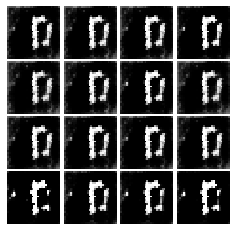

Epoch: 0, Iter: 280, D: 0.2908, G:2.403


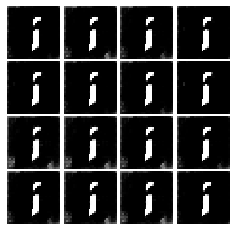

Epoch: 0, Iter: 300, D: 0.6098, G:4.202


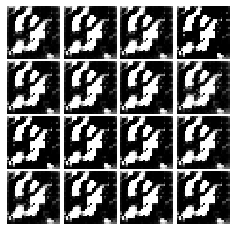

Epoch: 0, Iter: 320, D: 0.4855, G:3.27


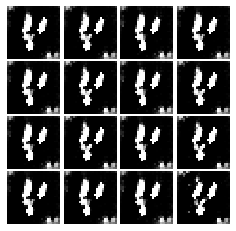

Epoch: 0, Iter: 340, D: 0.6744, G:2.188


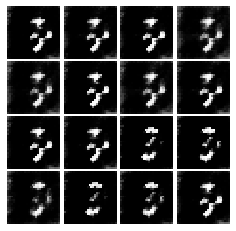

Epoch: 0, Iter: 360, D: 0.777, G:2.641


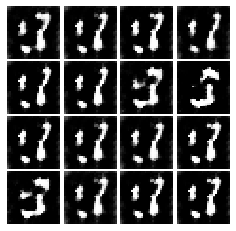

Epoch: 0, Iter: 380, D: 1.063, G:5.762


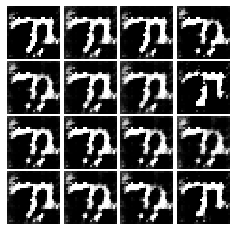

Epoch: 0, Iter: 400, D: 1.669, G:1.364


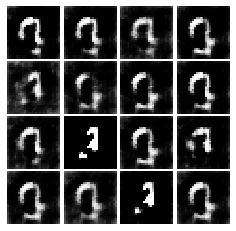

Epoch: 0, Iter: 420, D: 1.242, G:1.512


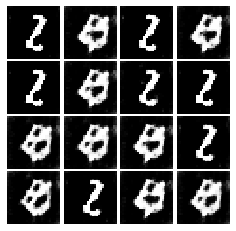

Epoch: 0, Iter: 440, D: 0.8923, G:2.076


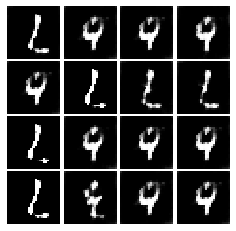

Epoch: 0, Iter: 460, D: 0.6564, G:2.047


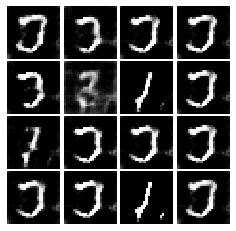

Epoch: 1, Iter: 480, D: 0.5114, G:2.425


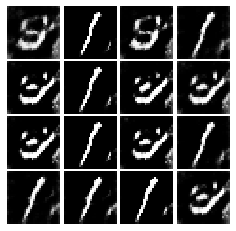

Epoch: 1, Iter: 500, D: 0.5937, G:1.793


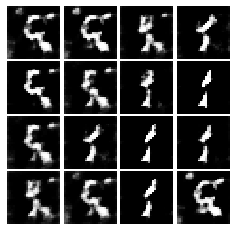

Epoch: 1, Iter: 520, D: 0.1841, G:3.499


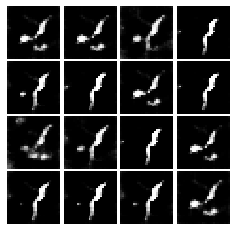

Epoch: 1, Iter: 540, D: 0.6376, G:2.222


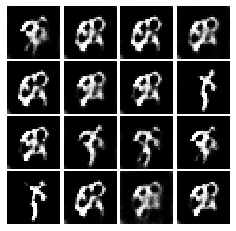

Epoch: 1, Iter: 560, D: 0.9353, G:1.946


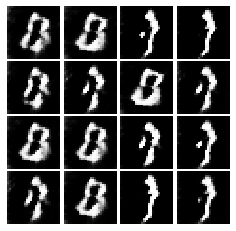

Epoch: 1, Iter: 580, D: 0.952, G:1.752


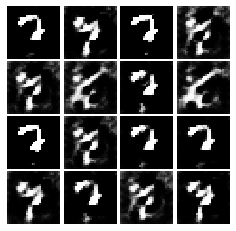

Epoch: 1, Iter: 600, D: 0.1171, G:3.743


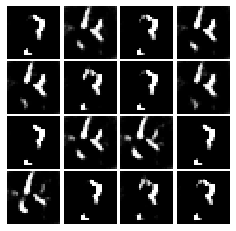

Epoch: 1, Iter: 620, D: 0.2215, G:3.433


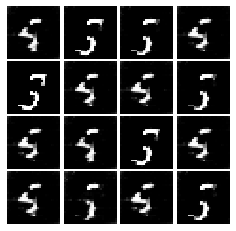

Epoch: 1, Iter: 640, D: 0.4811, G:2.868


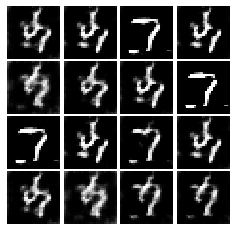

Epoch: 1, Iter: 660, D: 0.8953, G:2.312


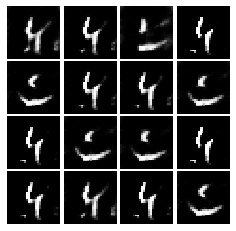

Epoch: 1, Iter: 680, D: 0.6894, G:2.897


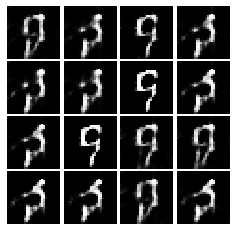

Epoch: 1, Iter: 700, D: 0.3639, G:3.158


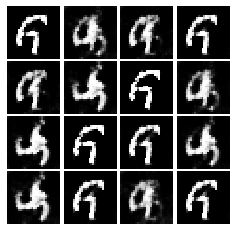

Epoch: 1, Iter: 720, D: 0.2911, G:4.633


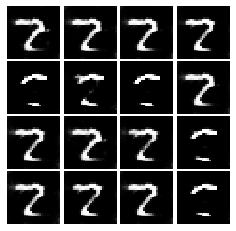

Epoch: 1, Iter: 740, D: 0.5582, G:0.6103


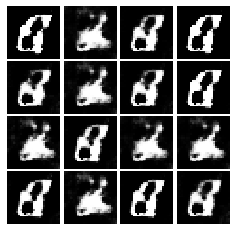

Epoch: 1, Iter: 760, D: 0.3572, G:3.178


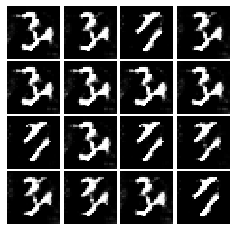

Epoch: 1, Iter: 780, D: 0.8785, G:4.54


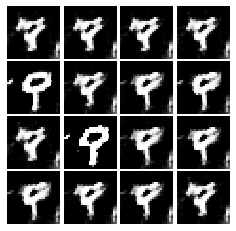

Epoch: 1, Iter: 800, D: 0.9904, G:3.532


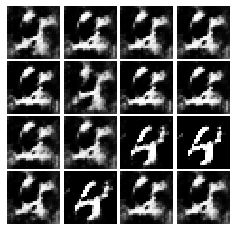

Epoch: 1, Iter: 820, D: 0.6998, G:2.643


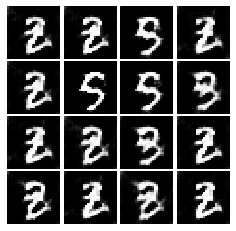

Epoch: 1, Iter: 840, D: 1.051, G:4.67


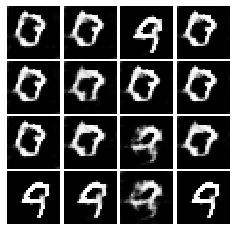

Epoch: 1, Iter: 860, D: 0.7909, G:4.802


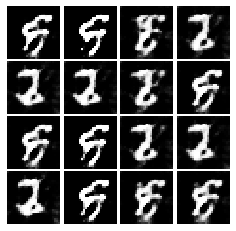

Epoch: 1, Iter: 880, D: 0.844, G:1.889


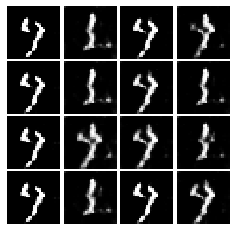

Epoch: 1, Iter: 900, D: 0.4099, G:3.504


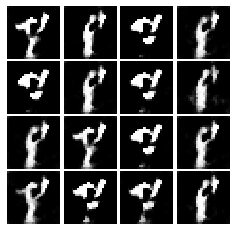

Epoch: 1, Iter: 920, D: 0.4893, G:2.713


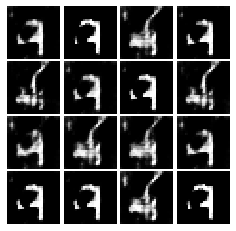

Epoch: 2, Iter: 940, D: 1.063, G:4.583


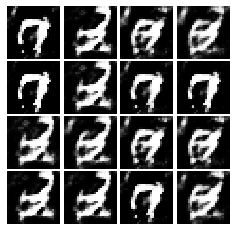

Epoch: 2, Iter: 960, D: 0.728, G:3.779


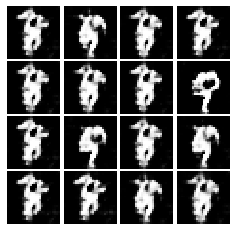

Epoch: 2, Iter: 980, D: 0.8527, G:2.416


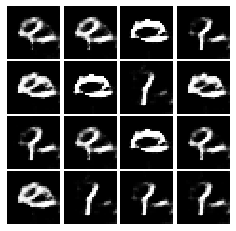

Epoch: 2, Iter: 1000, D: 1.016, G:5.087


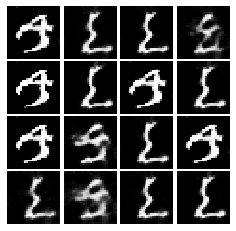

Epoch: 2, Iter: 1020, D: 0.475, G:2.338


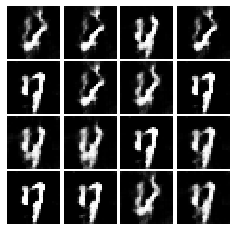

Epoch: 2, Iter: 1040, D: 0.5784, G:2.54


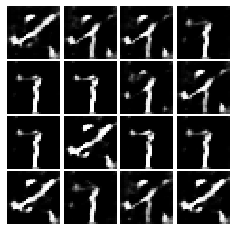

Epoch: 2, Iter: 1060, D: 0.5294, G:3.214


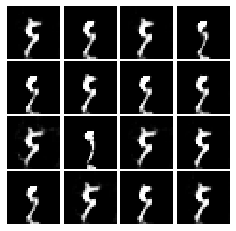

Epoch: 2, Iter: 1080, D: 1.039, G:6.004


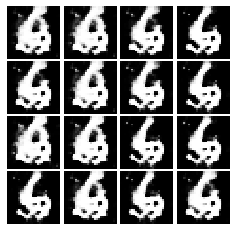

Epoch: 2, Iter: 1100, D: 0.169, G:3.563


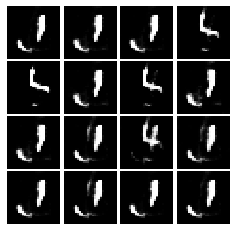

Epoch: 2, Iter: 1120, D: 0.6853, G:6.145


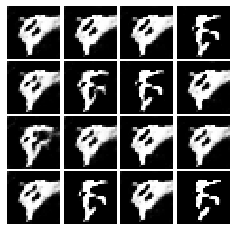

Epoch: 2, Iter: 1140, D: 0.4905, G:2.949


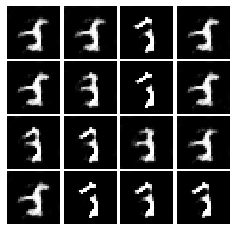

Epoch: 2, Iter: 1160, D: 0.6819, G:3.289


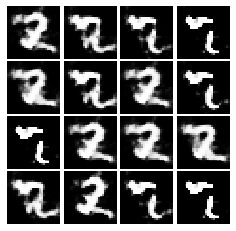

Epoch: 2, Iter: 1180, D: 0.4841, G:2.513


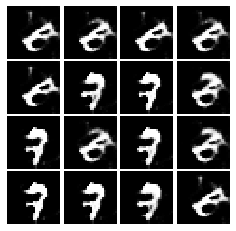

Epoch: 2, Iter: 1200, D: 0.409, G:4.133


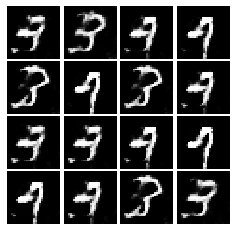

Epoch: 2, Iter: 1220, D: 0.2692, G:3.2


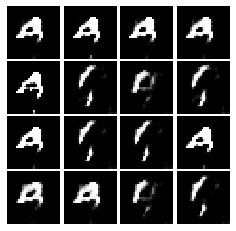

Epoch: 2, Iter: 1240, D: 0.3103, G:3.004


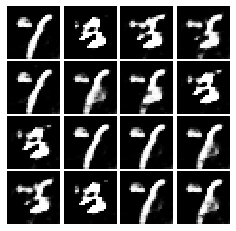

Epoch: 2, Iter: 1260, D: 0.4528, G:2.743


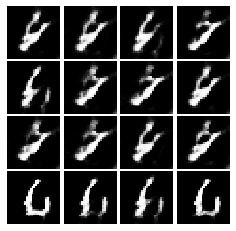

Epoch: 2, Iter: 1280, D: 0.3593, G:3.427


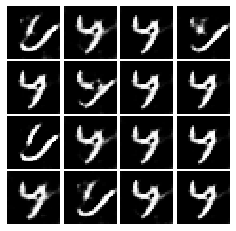

Epoch: 2, Iter: 1300, D: 0.5175, G:3.557


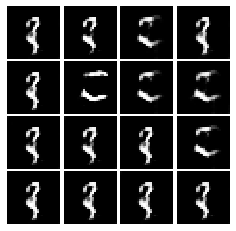

Epoch: 2, Iter: 1320, D: 0.8506, G:5.201


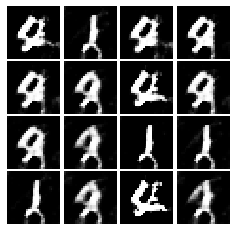

Epoch: 2, Iter: 1340, D: 0.3025, G:4.0


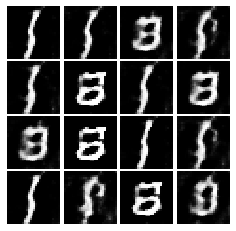

Epoch: 2, Iter: 1360, D: 1.237, G:2.542


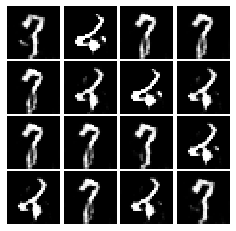

Epoch: 2, Iter: 1380, D: 0.3328, G:2.802


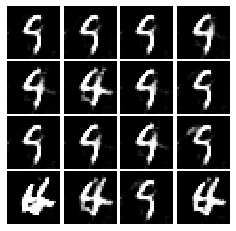

Epoch: 2, Iter: 1400, D: 0.5557, G:2.855


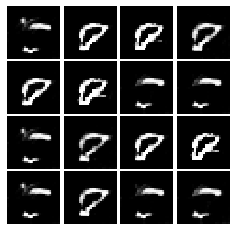

Epoch: 3, Iter: 1420, D: 0.1522, G:3.851


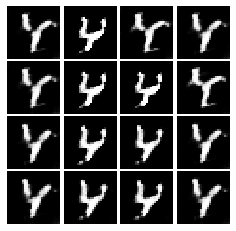

Epoch: 3, Iter: 1440, D: 0.3297, G:4.513


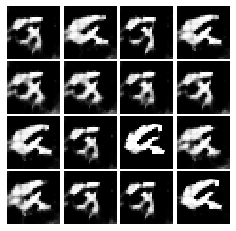

Epoch: 3, Iter: 1460, D: 1.188, G:3.535


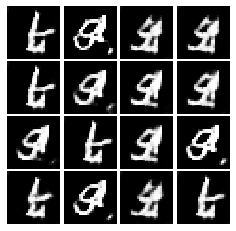

Epoch: 3, Iter: 1480, D: 0.337, G:3.805


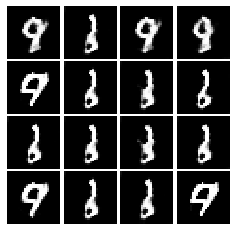

Epoch: 3, Iter: 1500, D: 0.3064, G:3.53


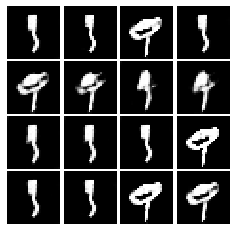

Epoch: 3, Iter: 1520, D: 0.1133, G:3.685


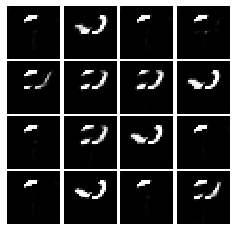

Epoch: 3, Iter: 1540, D: 0.5358, G:6.143


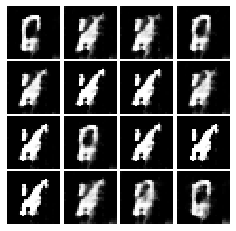

Epoch: 3, Iter: 1560, D: 0.5167, G:3.228


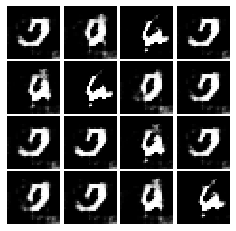

Epoch: 3, Iter: 1580, D: 0.3013, G:3.1


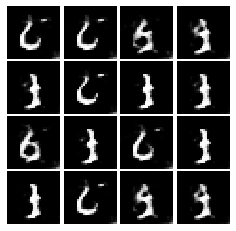

Epoch: 3, Iter: 1600, D: 0.5026, G:3.065


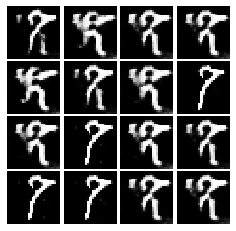

Epoch: 3, Iter: 1620, D: 0.2152, G:3.133


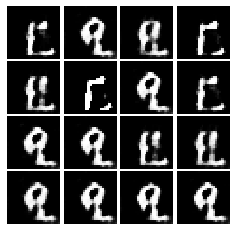

Epoch: 3, Iter: 1640, D: 0.7753, G:5.886


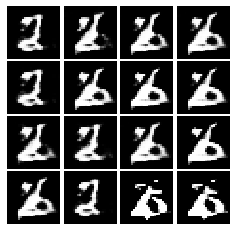

Epoch: 3, Iter: 1660, D: 0.3102, G:3.215


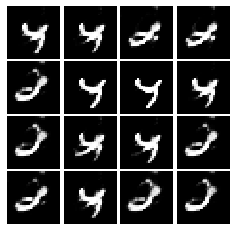

Epoch: 3, Iter: 1680, D: 0.2566, G:3.105


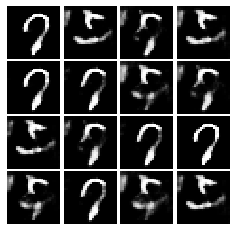

Epoch: 3, Iter: 1700, D: 0.224, G:3.215


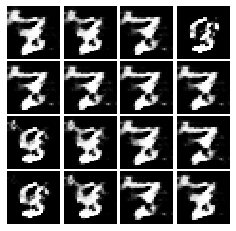

Epoch: 3, Iter: 1720, D: 0.06227, G:5.203


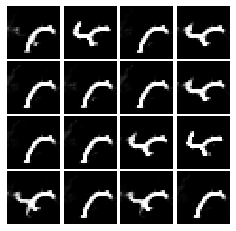

Epoch: 3, Iter: 1740, D: 2.969, G:12.17


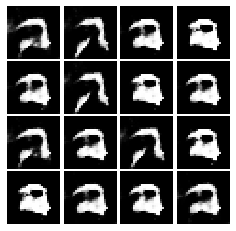

Epoch: 3, Iter: 1760, D: 0.3685, G:3.036


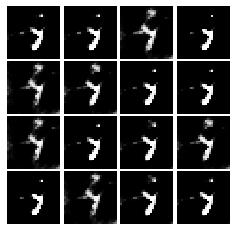

Epoch: 3, Iter: 1780, D: 0.1986, G:4.949


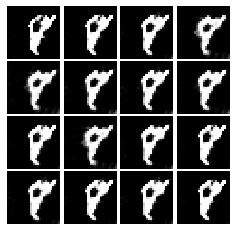

Epoch: 3, Iter: 1800, D: 0.8589, G:8.313


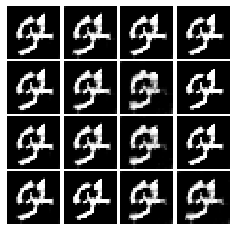

Epoch: 3, Iter: 1820, D: 0.2311, G:4.586


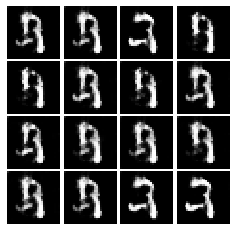

Epoch: 3, Iter: 1840, D: 0.4088, G:4.195


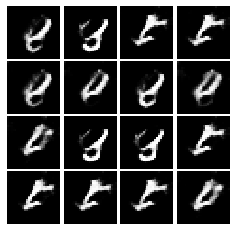

Epoch: 3, Iter: 1860, D: 0.7697, G:2.854


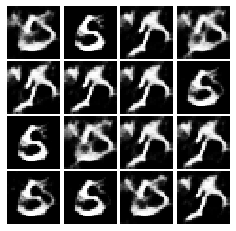

Epoch: 4, Iter: 1880, D: 0.2941, G:2.58


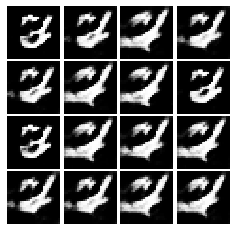

Epoch: 4, Iter: 1900, D: 3.072, G:4.116


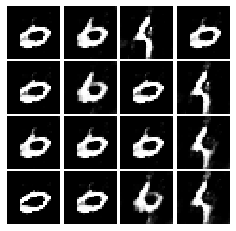

Epoch: 4, Iter: 1920, D: 0.4218, G:3.311


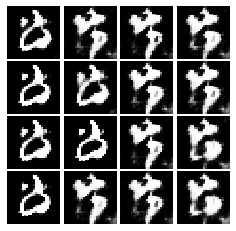

Epoch: 4, Iter: 1940, D: 0.5409, G:5.53


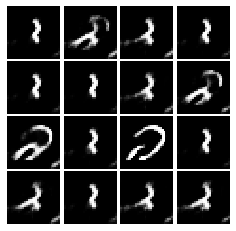

Epoch: 4, Iter: 1960, D: 0.3581, G:2.61


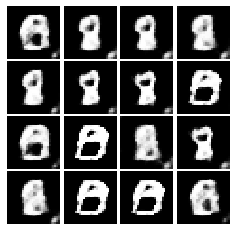

Epoch: 4, Iter: 1980, D: 0.4838, G:3.852


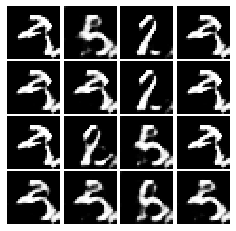

Epoch: 4, Iter: 2000, D: 1.523, G:7.85


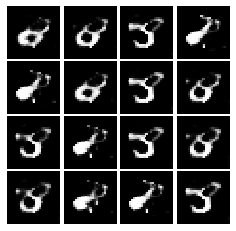

Epoch: 4, Iter: 2020, D: 0.318, G:3.808


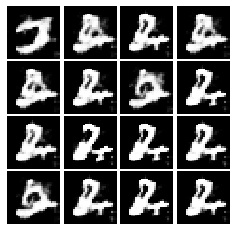

Epoch: 4, Iter: 2040, D: 0.3561, G:4.053


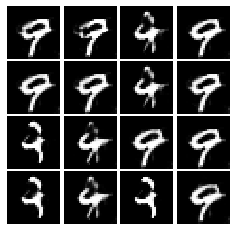

Epoch: 4, Iter: 2060, D: 0.4197, G:2.692


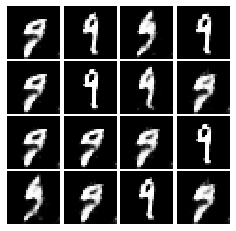

Epoch: 4, Iter: 2080, D: 0.3369, G:3.24


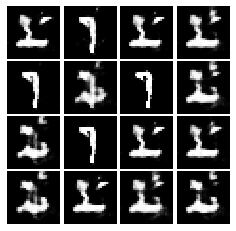

Epoch: 4, Iter: 2100, D: 0.1827, G:3.238


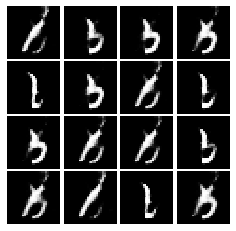

Epoch: 4, Iter: 2120, D: 0.3869, G:2.691


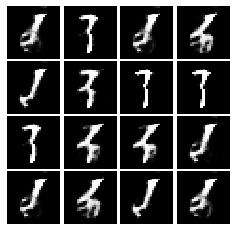

Epoch: 4, Iter: 2140, D: 0.5116, G:3.015


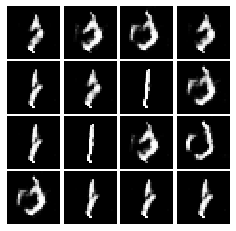

Epoch: 4, Iter: 2160, D: 0.4686, G:4.102


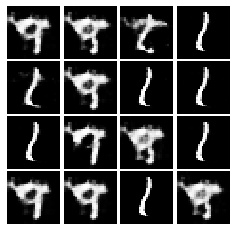

Epoch: 4, Iter: 2180, D: 0.6186, G:3.98


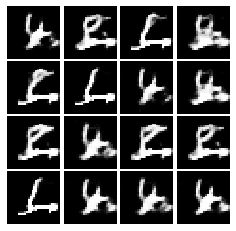

Epoch: 4, Iter: 2200, D: 0.8202, G:1.787


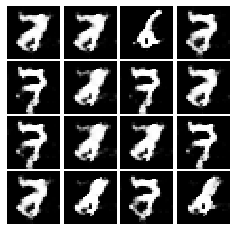

Epoch: 4, Iter: 2220, D: 0.2434, G:3.883


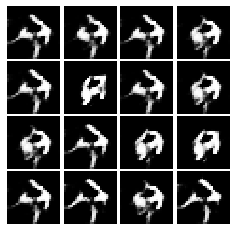

Epoch: 4, Iter: 2240, D: 0.4133, G:5.962


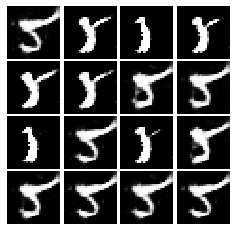

Epoch: 4, Iter: 2260, D: 0.1086, G:4.219


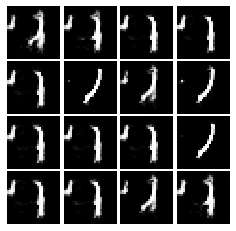

Epoch: 4, Iter: 2280, D: 0.4627, G:2.06


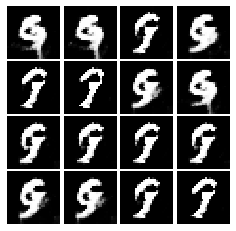

Epoch: 4, Iter: 2300, D: 0.4214, G:2.835


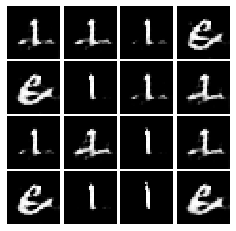

Epoch: 4, Iter: 2320, D: 0.2412, G:4.058


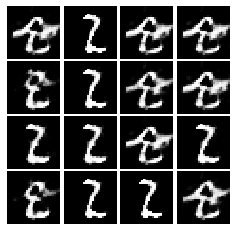

Epoch: 4, Iter: 2340, D: 1.259, G:3.484


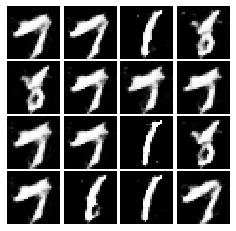

Final images


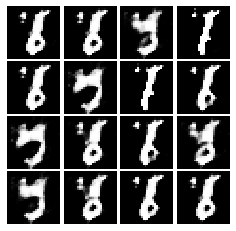

In [23]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)